In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.lines import Line2D
from scipy.stats import spearmanr

# 1. 读取数据
data_dir = Path("./preprocessed/preprocessed_with_zones")

classic_df = pd.read_csv(data_dir / "classic_with_climate_zones_filtered_30yr_mean.csv")
lpj_df = pd.read_csv(data_dir / "lpj_guess_with_climate_zones_filtered_30yr_mean.csv")

# 2. 变量列名映射
var_map = {
    "P": "precipitation",
    "T": "tran",
    "LAI": "lai",
    "ET": "evapotrans",
    "E_veg": "evspsblveg",
    "E_soil": "evspsblsoi"
}

# 3. 核心组合
pairs = [
    ("P", "ET"),
    ("P", "T"),
    ("P", "E_veg"),
    ("P", "E_soil"),
    ("LAI", "ET"),
    ("LAI", "T"),
    ("LAI", "E_veg"),
    ("LAI", "E_soil"),
]

zone_colors = {
    "HW": "#F27D7A",
    "HD": "#EFD447",
    "CW": "#95D98C",
    "CD": "#73AEEB",
}

zone_labels = {
    "HW": "WW - Warm-Wet",
    "HD": "WD - Warm-Dry",
    "CW": "CW - Cold-Wet",
    "CD": "CD - Cold-Dry",
}

# full_label_map = {
#     "P": "Precipitation",
#     "LAI": "Leaf Area Index",
#     "ET": "Evapotranspiration",
#     "T": "Transpiration",
#     "E_veg": "Vegetation Evaporation",
#     "E_soil": "Soil Evaporation"
# }
full_label_map = {
    "P": "Precipitation (mm yr$^{-1}$)",
    "LAI": "Leaf Area Index",
    "T": "Transpiration (mm yr$^{-1}$)",
    "ET": "Evapotranspiration (mm yr$^{-1}$)",
    "E_veg": "Vegetation Evaporation (mm yr$^{-1}$)",
    "E_soil": "Soil Evaporation (mm yr$^{-1}$)"
}

short_label_map = {
    "P": "Precipitation",
    "LAI": "Leaf Area Index",
    "T": "Transpiration",
    "ET": "Evapotranspiration",
    "E_veg": "Vegetation Evaporation",
    "E_soil": "Soil Evaporation"
}



In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from statsmodels.nonparametric.smoothers_lowess import lowess
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from scipy.optimize import curve_fit



# =========================================================
# 1. Equal-width binned median curve
# =========================================================

def compute_equal_width_binned_medians(
    x,
    y,
    n_bins=10,
    min_count_per_bin=20
):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < min_count_per_bin:
        return None

    x_min, x_max = np.nanmin(x), np.nanmax(x)

    if x_min == x_max:
        return None

    edges = np.linspace(x_min, x_max, n_bins + 1)

    x_med = []
    y_med = []

    for i in range(n_bins):
        left = edges[i]
        right = edges[i + 1]

        if i == n_bins - 1:
            mask = (x >= left) & (x <= right)
        else:
            mask = (x >= left) & (x < right)

        if np.sum(mask) < min_count_per_bin:
            continue

        x_med.append(np.nanmedian(x[mask]))
        y_med.append(np.nanmedian(y[mask]))

    if len(x_med) < 2:
        return None

    return {
        "x": np.asarray(x_med),
        "y": np.asarray(y_med)
    }


# =========================================================
# 2. Equal-count binned median curve
# =========================================================

def compute_equal_count_binned_medians(
    x,
    y,
    n_bins=10,
    min_count_per_bin=20
):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < min_count_per_bin:
        return None

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    bin_indices = np.array_split(np.arange(len(x)), n_bins)

    x_med = []
    y_med = []

    for idx in bin_indices:
        if len(idx) < min_count_per_bin:
            continue

        x_med.append(np.nanmedian(x[idx]))
        y_med.append(np.nanmedian(y[idx]))

    if len(x_med) < 2:
        return None

    return {
        "x": np.asarray(x_med),
        "y": np.asarray(y_med)
    }


# =========================================================
# 3. LOWESS curve
# =========================================================

def compute_lowess_curve(
    x,
    y,
    frac=0.18
):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return None

    try:
        smoothed = lowess(
            y,
            x,
            frac=frac,
            return_sorted=True
        )

        xs = smoothed[:, 0]
        uniq_idx = np.concatenate([[True], np.diff(xs) > 0])
        smoothed = smoothed[uniq_idx]

        if len(smoothed) < 2:
            return None

        return {
            "x": smoothed[:, 0],
            "y": smoothed[:, 1]
        }

    except Exception:
        return None


# =========================================================
# 4. Polynomial regression curve
# =========================================================

def compute_polynomial_curve(
    x,
    y,
    degree=3,
    n_grid=300
):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < degree + 2:
        return None

    try:
        x_grid = np.linspace(np.nanmin(x), np.nanmax(x), n_grid)

        poly = PolynomialFeatures(
            degree=degree,
            include_bias=False
        )

        X_poly = poly.fit_transform(x.reshape(-1, 1))

        model = LinearRegression()
        model.fit(X_poly, y)

        y_grid = model.predict(
            poly.transform(x_grid.reshape(-1, 1))
        )

        return {
            "x": x_grid,
            "y": y_grid
        }

    except Exception:
        return None


# =========================================================
# 5. GAM curve
# =========================================================

def compute_gam_curve(
    x,
    y,
    n_grid=300,
    n_splines=12
):
    try:
        from pygam import LinearGAM, s
    except ImportError:
        return None

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 20:
        return None

    try:
        x_grid = np.linspace(np.nanmin(x), np.nanmax(x), n_grid)

        gam = LinearGAM(
            s(0, n_splines=n_splines)
        ).fit(
            x.reshape(-1, 1),
            y
        )

        y_grid = gam.predict(x_grid.reshape(-1, 1))

        return {
            "x": x_grid,
            "y": y_grid
        }

    except Exception:
        return None


# =========================================================
# 6. Piecewise linear curve
# =========================================================

def piecewise_linear_one_break(x, x0, k1, k2, b):
    return np.where(
        x < x0,
        k1 * x + b,
        k1 * x0 + b + k2 * (x - x0)
    )


def compute_piecewise_linear_curve(
    x,
    y,
    n_grid=300
):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 20:
        return None

    try:
        x_min = np.nanmin(x)
        x_max = np.nanmax(x)

        x_grid = np.linspace(x_min, x_max, n_grid)

        p0 = [
            np.nanmedian(x),
            0.0,
            0.0,
            np.nanmedian(y)
        ]

        bounds = (
            [x_min, -np.inf, -np.inf, -np.inf],
            [x_max,  np.inf,  np.inf,  np.inf]
        )

        params, _ = curve_fit(
            piecewise_linear_one_break,
            x,
            y,
            p0=p0,
            bounds=bounds,
            maxfev=20000
        )

        y_grid = piecewise_linear_one_break(x_grid, *params)

        return {
            "x": x_grid,
            "y": y_grid
        }

    except Exception:
        return None


# =========================================================
# 7. Symbolic regression curve
# =========================================================

def compute_symbolic_regression_curve(
    x,
    y,
    n_grid=300,
    max_train=8000,
    random_state=42
):
    try:
        from gplearn.genetic import SymbolicRegressor
    except ImportError:
        return None

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 50:
        return None

    try:
        x_grid = np.linspace(np.nanmin(x), np.nanmax(x), n_grid)

        if len(x) > max_train:
            rng = np.random.default_rng(random_state)
            idx = rng.choice(
                len(x),
                size=max_train,
                replace=False
            )

            x_train = x[idx]
            y_train = y[idx]
        else:
            x_train = x
            y_train = y

        est = SymbolicRegressor(
            population_size=1000,
            generations=15,
            stopping_criteria=0.01,
            p_crossover=0.7,
            p_subtree_mutation=0.1,
            p_hoist_mutation=0.05,
            p_point_mutation=0.1,
            max_samples=0.8,
            verbose=0,
            parsimony_coefficient=0.01,
            random_state=random_state,
            function_set=("add", "sub", "mul", "div", "sqrt", "log")
        )

        est.fit(
            x_train.reshape(-1, 1),
            y_train
        )

        y_grid = est.predict(x_grid.reshape(-1, 1))

        return {
            "x": x_grid,
            "y": y_grid,
            "expression": str(est._program)
        }

    except Exception:
        return None


# =========================================================
# 8. Compute all curves for one x-y relation
# =========================================================

def compute_all_curves_for_relation(
    x,
    y,
    n_bins=10,
    min_count_per_bin=20,
    frac=0.18,
    poly_degree=3,
    include_symbolic=False
):
    curves = {}

    curves["Equal-width bins"] = compute_equal_width_binned_medians(
        x,
        y,
        n_bins=n_bins,
        min_count_per_bin=min_count_per_bin
    )

    curves["Equal-count bins"] = compute_equal_count_binned_medians(
        x,
        y,
        n_bins=n_bins,
        min_count_per_bin=min_count_per_bin
    )

    curves["LOWESS"] = compute_lowess_curve(
        x,
        y,
        frac=frac
    )

    curves[f"Polynomial degree {poly_degree}"] = compute_polynomial_curve(
        x,
        y,
        degree=poly_degree
    )

    curves["GAM"] = compute_gam_curve(
        x,
        y
    )

    curves["Piecewise linear"] = compute_piecewise_linear_curve(
        x,
        y
    )

    if include_symbolic:
        curves["Symbolic regression"] = compute_symbolic_regression_curve(
            x,
            y
        )

    curves = {
        method: curve
        for method, curve in curves.items()
        if curve is not None
    }

    return curves




compute_esm_curves_2x2() 是一个为 2×2 图准备数据的函数。它按照气候区、模型、输入变量和输出变量，提取原始散点，并调用 compute_all_curves_for_relation() 计算多种拟合曲线，最后把这些结果统一保存到 curve_results 里，供后续画图和 shape classification 使用。


In [3]:
# =========================================================
# 9. Compute ESM curves for 2×2 figure
# =========================================================

def compute_esm_curves_2x2(
    classic_df,
    lpj_df,
    var_map,
    climate_zone="HW",
    x_labels=("P", "LAI"),
    y_label="T",
    n_bins=10,
    min_count_per_bin=20,
    frac=0.18,
    poly_degree=3,
    include_symbolic=False
):
    model_specs = [
        ("CLASSIC", classic_df),
        ("LPJ-GUESS", lpj_df)
    ]

    curve_results = {}

    for x_label in x_labels:
        for model_name, df in model_specs:
            df_zone = df[df["climate_zone"] == climate_zone].copy()

            x_col = var_map[x_label]
            y_col = var_map[y_label]

            sub = (
                df_zone[[x_col, y_col]]
                .replace([np.inf, -np.inf], np.nan)
                .dropna()
                .copy()
            )

            x_raw = sub[x_col].values
            y_raw = sub[y_col].values

            curves = compute_all_curves_for_relation(
                x_raw,
                y_raw,
                n_bins=n_bins,
                min_count_per_bin=min_count_per_bin,
                frac=frac,
                poly_degree=poly_degree,
                include_symbolic=include_symbolic
            )

            curve_results[(x_label, y_label, model_name)] = {
                "x_raw": x_raw,
                "y_raw": y_raw,
                "sub": sub,
                "curves": curves,
                "n_points": len(sub)
            }

    return curve_results

In [4]:
def plot_esm_curves_2x2(
    curve_results,
    climate_zone="HW",
    x_labels=("P", "LAI"),
    y_label="T",
    model_names=("CLASSIC", "LPJ-GUESS"),
    sample_size=30000,
    point_size=3,
    point_alpha=0.18,
    line_width=1.2,
    n_cols_legend=3
):
    method_styles = {
        "Equal-width bins": {
            "color": "#1f77b4",
            "linestyle": "-"
        },
        "Equal-count bins": {
            "color": "#ff7f0e",
            "linestyle": "-"
        },
        "LOWESS": {
            "color": "#2ca02c",
            "linestyle": "-"
        },
        "Polynomial degree 3": {
            "color": "#d62728",
            "linestyle": "-"
        },
        "GAM": {
            "color": "#9467bd",
            "linestyle": "-"
        },
        "Piecewise linear": {
            "color": "#8c564b",
            "linestyle": "-"
        },
        "Symbolic regression": {
            "color": "#e377c2",
            "linestyle": "-"
        }
    }

    # y-axis limits aligned by row
    y_limits = {}

    for row, x_label in enumerate(x_labels):
        all_y = []

        for model_name in model_names:
            key = (x_label, y_label, model_name)

            if key in curve_results:
                y_raw = curve_results[key]["y_raw"]

                if len(y_raw) > 0:
                    all_y.append(y_raw)

        if len(all_y) > 0:
            y_all = np.concatenate(all_y)

            ymin, ymax = np.nanpercentile(y_all, [1, 99])
            yrange = ymax - ymin

            if yrange == 0:
                yrange = 1

            y_limits[row] = (
                ymin - 0.05 * yrange,
                ymax + 0.05 * yrange
            )

    fig, axes = plt.subplots(
        2,
        2,
        figsize=(9, 8),
        dpi=180
    )

    for row, x_label in enumerate(x_labels):
        for col, model_name in enumerate(model_names):
            ax = axes[row, col]

            key = (x_label, y_label, model_name)

            if key not in curve_results:
                continue

            result = curve_results[key]

            x_raw = result["x_raw"]
            y_raw = result["y_raw"]
            sub = result["sub"]
            curves = result["curves"]

            # Scatter sampling
            if len(sub) > sample_size:
                sub_plot = sub.sample(sample_size, random_state=42)
                x_plot = sub_plot.iloc[:, 0].values
                y_plot = sub_plot.iloc[:, 1].values
            else:
                x_plot = x_raw
                y_plot = y_raw

            ax.scatter(
                x_plot,
                y_plot,
                s=point_size,
                alpha=point_alpha,
                color="0.70",
                linewidths=0,
                zorder=1
            )

            # Plot fitted curves
            for method, curve in curves.items():
                style = method_styles.get(
                    method,
                    {
                        "color": "black",
                        "linestyle": "-"
                    }
                )

                ax.plot(
                    curve["x"],
                    curve["y"],
                    color=style["color"],
                    linestyle=style["linestyle"],
                    linewidth=line_width,
                    label=method,
                    zorder=5
                )

            # Model label
            ax.text(
                0.03,
                0.97,
                model_name,
                transform=ax.transAxes,
                fontsize=12,
                fontweight="bold",
                ha="left",
                va="top",
                bbox=dict(
                    boxstyle="round,pad=0.25",
                    facecolor="white",
                    edgecolor="0.65",
                    alpha=0.90
                ),
                zorder=20
            )

            ax.set_xlabel(
                full_label_map.get(x_label, x_label),
                fontsize=12.5
            )

            ax.set_ylabel(
                full_label_map.get(y_label, y_label),
                fontsize=12.5
            )

            if row in y_limits:
                ax.set_ylim(y_limits[row])

            ax.set_title(
                f"{short_label_map.get(x_label, x_label)} → "
                f"{short_label_map.get(y_label, y_label)}",
                fontsize=13,
                pad=9
            )

            ax.set_facecolor("white")
            ax.set_axisbelow(True)
            ax.grid(
                True,
                which="major",
                color="0.82",
                linestyle="-",
                linewidth=0.8
            )
            ax.minorticks_off()

            for side in ["top", "right", "bottom", "left"]:
                ax.spines[side].set_visible(True)
                ax.spines[side].set_linewidth(0.9)
                ax.spines[side].set_color("0.35")

            ax.tick_params(
                axis="both",
                which="major",
                labelsize=10.5,
                length=4,
                width=0.8,
                color="0.35"
            )

    handles, labels = axes[0, 0].get_legend_handles_labels()

    fig.legend(
        handles,
        labels,
        loc="lower center",
        ncol=n_cols_legend,
        frameon=True,
        fontsize=10.5,
        bbox_to_anchor=(0.5, -0.01)
    )

    fig.suptitle(
        # f"{climate_zone} zone: fitted response curves for "
        f"Warm-wet zone: fitted response curves for "
        f"{short_label_map.get(y_label, y_label)}",
        fontsize=15,
        y=0.98
    )

    plt.tight_layout(rect=[0.03, 0.03, 1, 0.96])
    plt.show()

### 单独画线

In [5]:
def plot_each_curve_4x7(
    curve_results,
    y_label="T",
    x_labels=("P", "LAI"),
    model_names=("CLASSIC", "LPJ-GUESS"),
    methods_order=None,
    show_scatter=True,
    sample_size=12000,
    point_size=2,
    point_alpha=0.12,
    line_width=2.2,
    figsize=(19, 10),
    title_fontsize=15,
    row_label_fontsize=15,
    axis_label_fontsize=13,
    tick_fontsize=11
):
    """
    Plot fitted curves as a 4 x 7 panel.

    Rows:
        CLASSIC: P -> y
        CLASSIC: LAI -> y
        LPJ-GUESS: P -> y
        LPJ-GUESS: LAI -> y

    Columns:
        Fitting methods
    """

    if methods_order is None:
        methods_order = [
            "Equal-width bins",
            "Equal-count bins",
            "LOWESS",
            "Polynomial degree 3",
            "GAM",
            "Piecewise linear",
            "Symbolic regression"
        ]

    # only keep methods that exist in curve_results
    available_methods = []
    for method in methods_order:
        for result in curve_results.values():
            if method in result["curves"]:
                available_methods.append(method)
                break

    methods_order = available_methods

    relation_specs = []
    for model_name in model_names:
        for x_label in x_labels:
            key = (x_label, y_label, model_name)
            if key in curve_results:
                relation_specs.append((model_name, x_label, y_label, key))

    n_rows = len(relation_specs)
    n_cols = len(methods_order)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=figsize,
        dpi=180,
        squeeze=False
    )
    fig.subplots_adjust(
        wspace=0.08,
        hspace=0.08
    )   

    method_color_map = {
        "Equal-width bins": "#1f77b4",
        "Equal-count bins": "#ff7f0e",
        "LOWESS": "#2ca02c",
        "Polynomial degree 3": "#d62728",
        "GAM": "#9467bd",
        "Piecewise linear": "#8c564b",
        "Symbolic regression": "#e377c2"
    }

    method_title_map = {
        "Equal-width bins": "Equal-width\nbins",
        "Equal-count bins": "Equal-count\nbins",
        "LOWESS": "LOWESS",
        "Polynomial degree 3": "Polynomial\nregression",
        "GAM": "GAM",
        "Piecewise linear": "Piecewise\nlinear",
        "Symbolic regression": "Symbolic\nregression"
    }

    x_label_map = {
        "P": "Precipitation",
        "LAI": "LAI"
    }

    y_label_map = {
        "T": "Transpiration",
        "ET": "Evapotranspiration",
        "E_veg": "Vegetation evaporation",
        "E_soil": "Soil evaporation"
    }
    x_label_map = {
        "P": "P",
        "LAI": "LAI"
    }
    y_label_map = {
        "T": "T",
        "ET": "Evapotranspiration",
        "E_veg": "Vegetation evaporation",
        "E_soil": "E_soil"
    }

    full_x_label_map = {
        "P": "Precipitation (mm yr$^{-1}$)",
        "LAI": "LAI"
    }

    full_y_label_map = {
        "T": "Transpiration (mm yr$^{-1}$)",
        "ET": "Evapotranspiration (mm yr$^{-1}$)",
        "E_veg": "Vegetation evaporation (mm yr$^{-1}$)",
        "E_soil": "Soil evaporation (mm yr$^{-1}$)"
    }

    for row, (model_name, x_label, y_label, key) in enumerate(relation_specs):
        result = curve_results[key]

        x_raw = result["x_raw"]
        y_raw = result["y_raw"]
        sub = result["sub"]

        model_short = "LPJ" if model_name == "LPJ-GUESS" else model_name

        for col, method in enumerate(methods_order):
            ax = axes[row, col]

            curve = result["curves"].get(method, None)

            if show_scatter:
                if len(sub) > sample_size:
                    sub_plot = sub.sample(sample_size, random_state=42)
                    x_plot = sub_plot.iloc[:, 0].values
                    y_plot = sub_plot.iloc[:, 1].values
                else:
                    x_plot = x_raw
                    y_plot = y_raw

                ax.scatter(
                    x_plot,
                    y_plot,
                    s=point_size,
                    alpha=point_alpha,
                    color="0.65",
                    linewidths=0,
                    zorder=1
                )

            if curve is not None:
                ax.plot(
                    curve["x"],
                    curve["y"],
                    color=method_color_map.get(method, "black"),
                    linewidth=line_width,
                    zorder=5
                )
            else:
                ax.text(
                    0.5,
                    0.5,
                    "Not available",
                    transform=ax.transAxes,
                    ha="center",
                    va="center",
                    fontsize=axis_label_fontsize,
                    color="0.4"
                )

            # column titles: method names
            if row == 0:
                ax.set_title(
                    method_title_map.get(method, method),
                    fontsize=title_fontsize,
                    pad=12,
                    fontweight="bold"
                )

            # row labels on the left
            if col == 0:
                ax.set_ylabel(
                    f"{model_short}: \n {x_label_map.get(x_label, x_label)} → {y_label_map.get(y_label, y_label)}\n"
                    f"{y_label_map.get(y_label, y_label)}",
                    fontsize=row_label_fontsize,
                    fontweight="bold"
                )
            else:
                ax.set_ylabel("")

            # # x labels only bottom row
            # if row == n_rows - 1:
            #     ax.set_xlabel(
            #         x_label_map.get(x_label, x_label),
            #         fontsize=axis_label_fontsize
            #     )
            # else:
            #     ax.set_xlabel("")
            
            # x labels on every row
            ax.set_xlabel(
                x_label_map.get(x_label, x_label),
                fontsize=axis_label_fontsize
            )

            ax.grid(True, color="0.85", linewidth=0.8)
            ax.set_facecolor("white")

            for side in ["top", "right", "bottom", "left"]:
                ax.spines[side].set_visible(True)
                ax.spines[side].set_linewidth(0.9)
                ax.spines[side].set_color("0.35")

            ax.tick_params(
                axis="both",
                labelsize=tick_fontsize,
                length=4,
                width=0.8,
                color="0.35"
            )

    fig.suptitle(
        f"Separate fitted curves for {y_label_map.get(y_label, y_label)}",
        fontsize=18,
        fontweight="bold",
        y=0.995
    )



    fig.subplots_adjust(
        wspace=0.38,
        hspace=0.35
    )

  
    plt.show()

### 拟合曲线 ——T

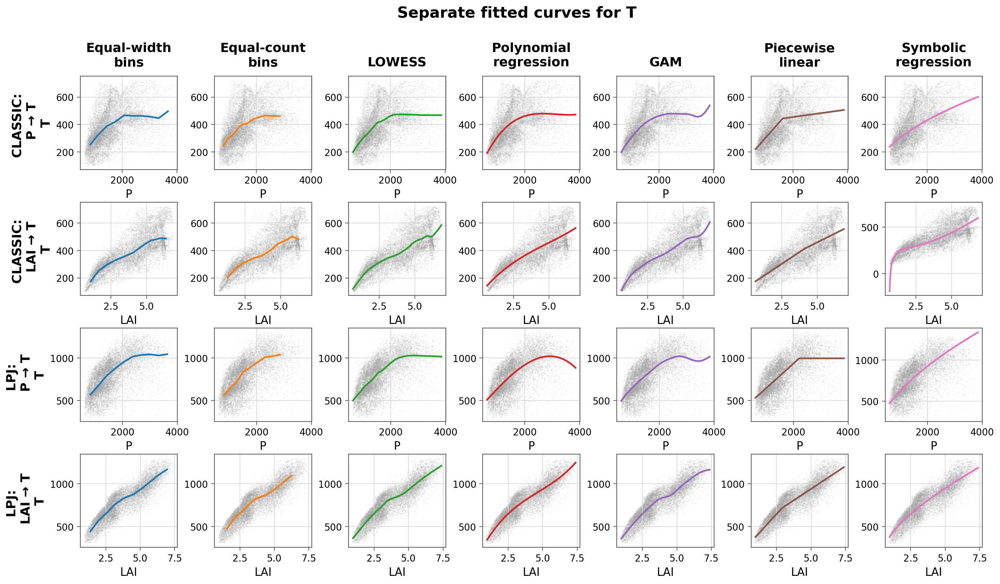

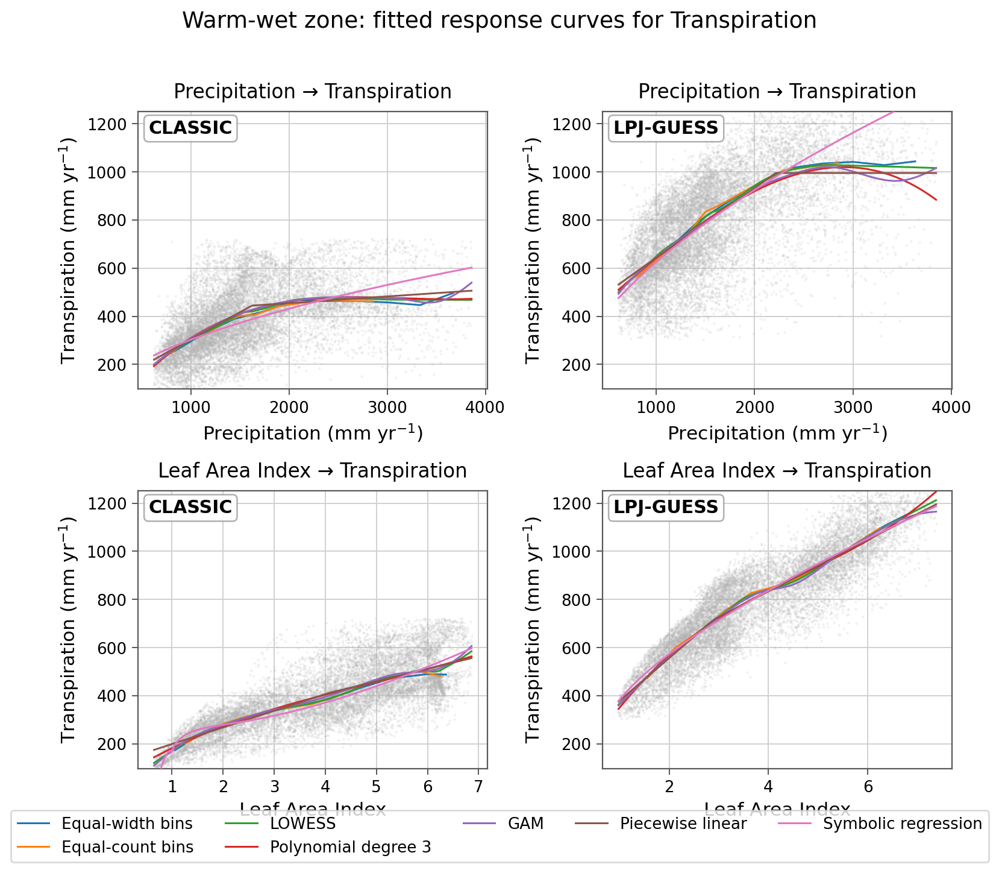

In [6]:
curve_results_t = compute_esm_curves_2x2(
    classic_df,
    lpj_df,
    var_map=var_map,
    climate_zone="HW",
    x_labels=("P", "LAI"),
    y_label="T",
    n_bins=10,
    min_count_per_bin=20,
    frac=0.18,
    poly_degree=3,
    include_symbolic=True
)


plot_each_curve_4x7(
    curve_results_t,
    y_label="T",
    x_labels=("P", "LAI"),
    model_names=("CLASSIC", "LPJ-GUESS"),
    show_scatter=True,
    line_width=2.0
)

plot_esm_curves_2x2(
    curve_results_t,
    climate_zone="HW",
    x_labels=("P", "LAI"),
    y_label="T",
    model_names=("CLASSIC", "LPJ-GUESS"),
    line_width=1.2,
    point_alpha=0.18,
    n_cols_legend=5
)

### 画soil

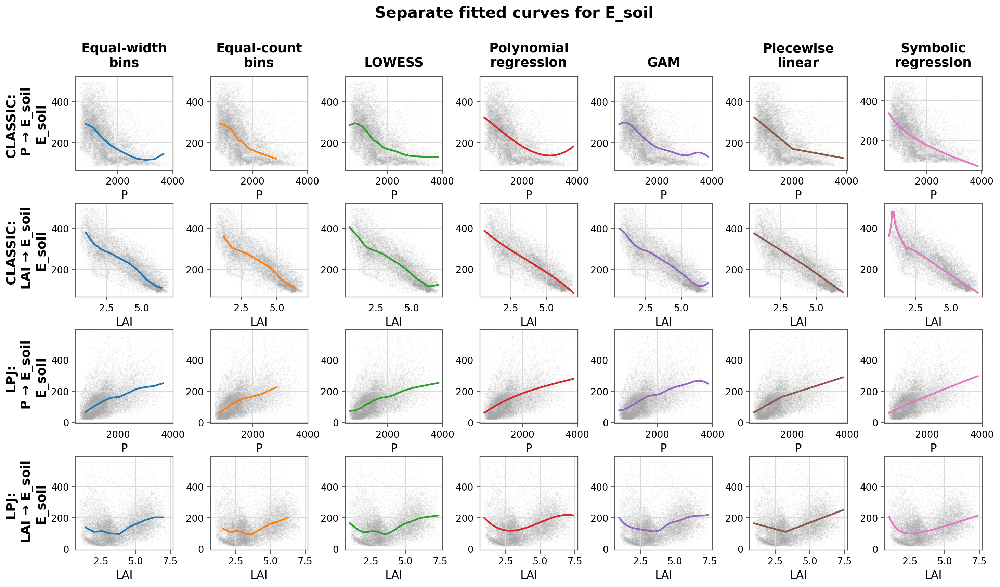

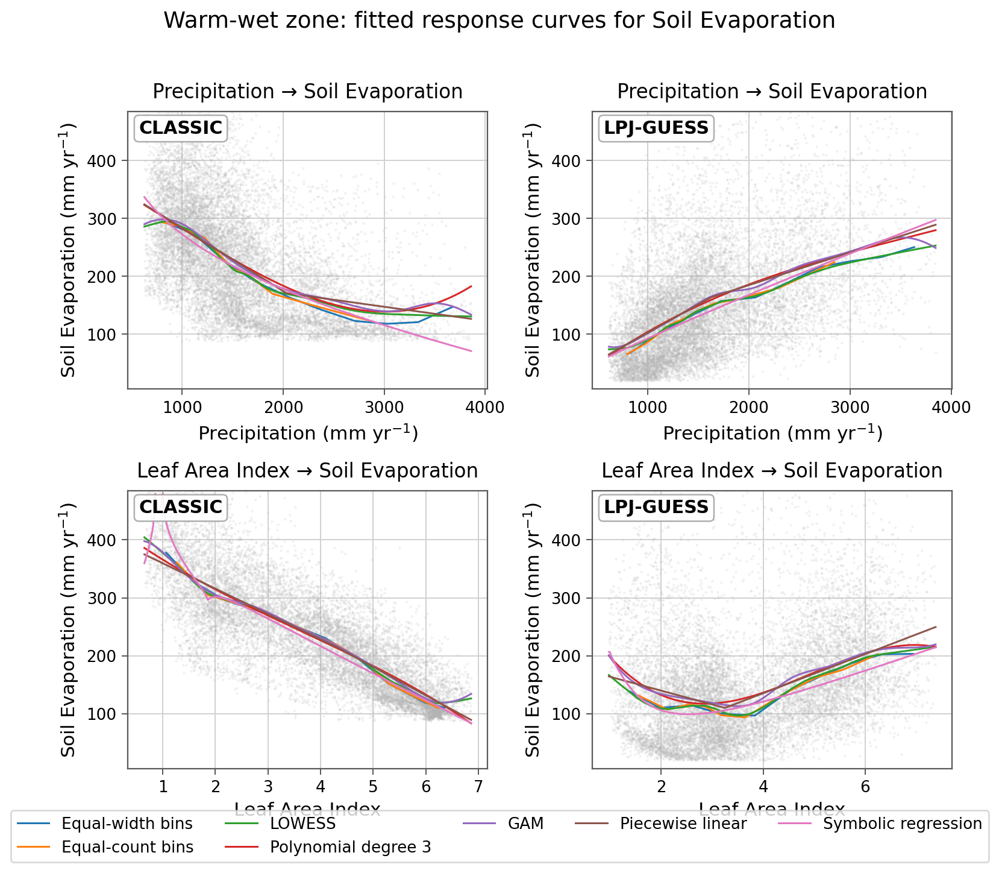

In [7]:
curve_results_esoil = compute_esm_curves_2x2(
    classic_df,
    lpj_df,
    var_map=var_map,
    climate_zone="HW",
    x_labels=("P", "LAI"),
    y_label="E_soil",
    n_bins=10,
    min_count_per_bin=20,
    frac=0.18,
    poly_degree=3,
    include_symbolic=True
)

plot_each_curve_4x7(
    curve_results_esoil,
    y_label="E_soil",
    x_labels=("P", "LAI"),
    model_names=("CLASSIC", "LPJ-GUESS"),
    show_scatter=True,
    line_width=2.0
)

plot_esm_curves_2x2(
    curve_results_esoil,
    climate_zone="HW",
    x_labels=("P", "LAI"),
    y_label="E_soil",
    model_names=("CLASSIC", "LPJ-GUESS"),
    line_width=1.2,
    point_alpha=0.18,
    n_cols_legend=5
)

# Curve shape classifier

In [8]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import pearsonr, spearmanr, kendalltau, norm
import statsmodels.api as sm
from sklearn.isotonic import IsotonicRegression
### 其他的测试维度的方法 斯皮尔曼 皮尔逊 等
# =========================================================
# 6. Spearman / Pearson / U-test methods
# =========================================================

def lind_mehlum_quadratic_test(x, y, alpha=0.05):
    """
    Quadratic U-test inspired by Lind-Mehlum.

    Fit:
        y = b0 + b1*x + b2*x^2

    U-shaped:
        slope at lower x < 0
        slope at upper x > 0
        turning point inside x range

    Inverted-U-shaped:
        slope at lower x > 0
        slope at upper x < 0
        turning point inside x range
    """

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 10:
        return {"lm_result": "Insufficient data"}

    x_min = np.nanmin(x)
    x_max = np.nanmax(x)

    if x_max == x_min:
        return {"lm_result": "Insufficient data"}

    x_norm = (x - x_min) / (x_max - x_min)

    X = np.column_stack([
        np.ones_like(x_norm),
        x_norm,
        x_norm ** 2
    ])

    model = sm.OLS(y, X).fit()

    b0, b1, b2 = model.params
    cov = model.cov_params()

    x_low = np.nanmin(x_norm)
    x_high = np.nanmax(x_norm)

    slope_low = b1 + 2 * b2 * x_low
    slope_high = b1 + 2 * b2 * x_high

    c_low = np.array([0, 1, 2 * x_low])
    c_high = np.array([0, 1, 2 * x_high])

    se_low = np.sqrt(c_low @ cov @ c_low)
    se_high = np.sqrt(c_high @ cov @ c_high)

    z_low = slope_low / se_low if se_low > 0 else np.nan
    z_high = slope_high / se_high if se_high > 0 else np.nan

    p_low_neg = norm.cdf(z_low)
    p_high_pos = 1 - norm.cdf(z_high)

    p_low_pos = 1 - norm.cdf(z_low)
    p_high_neg = norm.cdf(z_high)

    p_u = max(p_low_neg, p_high_pos)
    p_inv_u = max(p_low_pos, p_high_neg)

    turning_point = -b1 / (2 * b2) if b2 != 0 else np.nan
    turning_inside = 0 < turning_point < 1

    u_supported = (
        b2 > 0
        and turning_inside
        and slope_low < 0
        and slope_high > 0
        and p_u < alpha
    )

    inv_u_supported = (
        b2 < 0
        and turning_inside
        and slope_low > 0
        and slope_high < 0
        and p_inv_u < alpha
    )

    if u_supported:
        lm_result = "U-shaped"
    elif inv_u_supported:
        lm_result = "Inverted-U-shaped"
    else:
        lm_result = "No U-shape detected"

    return {
        "lm_result": lm_result,
        "lm_b2": b2,
        "lm_turning_point_norm": turning_point,
        "lm_turning_inside": turning_inside,
        "lm_slope_low": slope_low,
        "lm_slope_high": slope_high,
        "lm_p_u": p_u,
        "lm_p_inv_u": p_inv_u,
    }


def two_line_test(x, y, alpha=0.05, min_side_n=10):
    """
    Practical two-line test.

    Search for a breakpoint.
    Fit one line on the left and one line on the right.

    U-shaped:
        left slope < 0 and significant
        right slope > 0 and significant

    Inverted-U-shaped:
        left slope > 0 and significant
        right slope < 0 and significant
    """

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 2 * min_side_n:
        return {"two_line_result": "Insufficient data"}

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    candidate_indices = range(min_side_n, len(x) - min_side_n)

    best = None

    for idx in candidate_indices:
        x_left = x[:idx]
        y_left = y[:idx]
        x_right = x[idx:]
        y_right = y[idx:]

        X_left = sm.add_constant(x_left)
        X_right = sm.add_constant(x_right)

        left_model = sm.OLS(y_left, X_left).fit()
        right_model = sm.OLS(y_right, X_right).fit()

        rss = np.sum(left_model.resid ** 2) + np.sum(right_model.resid ** 2)

        if best is None or rss < best["rss"]:
            best = {
                "break_index": idx,
                "break_x": x[idx],
                "rss": rss,
                "left_model": left_model,
                "right_model": right_model
            }

    left_model = best["left_model"]
    right_model = best["right_model"]

    left_slope = left_model.params[1]
    right_slope = right_model.params[1]

    left_se = left_model.bse[1]
    right_se = right_model.bse[1]

    z_left = left_slope / left_se if left_se > 0 else np.nan
    z_right = right_slope / right_se if right_se > 0 else np.nan

    p_left_neg = norm.cdf(z_left)
    p_right_pos = 1 - norm.cdf(z_right)

    p_left_pos = 1 - norm.cdf(z_left)
    p_right_neg = norm.cdf(z_right)

    p_u = max(p_left_neg, p_right_pos)
    p_inv_u = max(p_left_pos, p_right_neg)

    u_supported = (
        left_slope < 0
        and right_slope > 0
        and p_u < alpha
    )

    inv_u_supported = (
        left_slope > 0
        and right_slope < 0
        and p_inv_u < alpha
    )

    if u_supported:
        two_line_result = "U-shaped"
    elif inv_u_supported:
        two_line_result = "Inverted-U-shaped"
    else:
        two_line_result = "No U-shape detected"

    return {
        "two_line_result": two_line_result,
        "two_line_break_x": best["break_x"],
        "two_line_left_slope": left_slope,
        "two_line_right_slope": right_slope,
        "two_line_p_u": p_u,
        "two_line_p_inv_u": p_inv_u,
    }


def order_restricted_u_detection(
    x,
    y,
    min_side_n=10,
    amplitude_threshold=0.10
):
    """
    Shape-constrained U detection using isotonic regression.

    U-shaped:
        left side constrained decreasing
        right side constrained increasing

    Inverted-U-shaped:
        left side constrained increasing
        right side constrained decreasing

    This is a constrained-fit detector, not a p-value test.
    """

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 2 * min_side_n:
        return {"order_result": "Insufficient data"}

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    y_min = np.nanmin(y)
    y_max = np.nanmax(y)

    if y_max == y_min:
        return {"order_result": "Flat / no U-shape detected"}

    y_norm = (y - y_min) / (y_max - y_min)

    best_u = None
    best_inv_u = None

    for idx in range(min_side_n, len(x) - min_side_n):
        x_left = x[:idx + 1]
        y_left = y_norm[:idx + 1]

        x_right = x[idx:]
        y_right = y_norm[idx:]

        # U: decreasing left, increasing right
        iso_left_dec = IsotonicRegression(increasing=False, out_of_bounds="clip")
        iso_right_inc = IsotonicRegression(increasing=True, out_of_bounds="clip")

        yhat_left_u = iso_left_dec.fit_transform(x_left, y_left)
        yhat_right_u = iso_right_inc.fit_transform(x_right, y_right)

        rss_u = (
            np.sum((y_left - yhat_left_u) ** 2)
            + np.sum((y_right - yhat_right_u) ** 2)
        )

        left_drop = yhat_left_u[0] - yhat_left_u[-1]
        right_rise = yhat_right_u[-1] - yhat_right_u[0]

        if best_u is None or rss_u < best_u["rss"]:
            best_u = {
                "rss": rss_u,
                "turn_x": x[idx],
                "left_drop": left_drop,
                "right_rise": right_rise
            }

        # Inverted-U: increasing left, decreasing right
        iso_left_inc = IsotonicRegression(increasing=True, out_of_bounds="clip")
        iso_right_dec = IsotonicRegression(increasing=False, out_of_bounds="clip")

        yhat_left_inv = iso_left_inc.fit_transform(x_left, y_left)
        yhat_right_inv = iso_right_dec.fit_transform(x_right, y_right)

        rss_inv = (
            np.sum((y_left - yhat_left_inv) ** 2)
            + np.sum((y_right - yhat_right_inv) ** 2)
        )

        left_rise = yhat_left_inv[-1] - yhat_left_inv[0]
        right_drop = yhat_right_inv[0] - yhat_right_inv[-1]

        if best_inv_u is None or rss_inv < best_inv_u["rss"]:
            best_inv_u = {
                "rss": rss_inv,
                "turn_x": x[idx],
                "left_rise": left_rise,
                "right_drop": right_drop
            }

    u_valid = (
        best_u["left_drop"] >= amplitude_threshold
        and best_u["right_rise"] >= amplitude_threshold
    )

    inv_u_valid = (
        best_inv_u["left_rise"] >= amplitude_threshold
        and best_inv_u["right_drop"] >= amplitude_threshold
    )

    if u_valid and (not inv_u_valid or best_u["rss"] <= best_inv_u["rss"]):
        order_result = "U-shaped"
    elif inv_u_valid:
        order_result = "Inverted-U-shaped"
    else:
        order_result = "No U-shape detected"

    return {
        "order_result": order_result,
        "order_u_rss": best_u["rss"],
        "order_u_turn_x": best_u["turn_x"],
        "order_u_left_drop": best_u["left_drop"],
        "order_u_right_rise": best_u["right_rise"],
        "order_inv_rss": best_inv_u["rss"],
        "order_inv_turn_x": best_inv_u["turn_x"],
        "order_inv_left_rise": best_inv_u["left_rise"],
        "order_inv_right_drop": best_inv_u["right_drop"],
    }


In [9]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import pearsonr, spearmanr, kendalltau, norm
import statsmodels.api as sm
from sklearn.isotonic import IsotonicRegression

### 辅助分类函数

In [10]:
def classify_monotonic_subtype(
    x_curve,
    y_curve,
    direction,
    slope_tol=0.03,
    min_slope_strength=0.06,
    saturation_ratio_threshold=0.75,
    acceleration_ratio_threshold=1.40,
    linear_ratio_lower=0.80,
    linear_ratio_upper=1.25,
    late_y_range_threshold=0.08,
    stage_tolerance=0.25,
):
    """
    Secondary classification for curves already classified as
    Monotonic increase or Monotonic decrease.

    Subtypes:
    - Saturating increase/decrease
    - Accelerating increase/decrease
    - Near-linear increase/decrease
    - Other monotonic increase/decrease

    Notes
    -----
    For decreasing curves, strength is the absolute magnitude of negative slopes,
    so late_to_early_ratio is always positive and has the same interpretation:
    < 1 means weakening response, > 1 means strengthening response.
    """

    if direction not in ["increase", "decrease"]:
        raise ValueError("direction must be 'increase' or 'decrease'.")

    empty = {
        "monotonic_subtype": f"Other monotonic {direction}",
        "early_strength": np.nan,
        "middle_strength": np.nan,
        "late_strength": np.nan,
        "late_to_early_ratio": np.nan,
        "middle_to_early_ratio": np.nan,
        "late_y_range": np.nan,
        "late_plateau": False,
        "late_near_flat": False,
    }

    x = np.asarray(x_curve, dtype=float)
    y = np.asarray(y_curve, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 8:
        return empty

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    unique_mask = np.concatenate([[True], np.diff(x) > 0])
    x = x[unique_mask]
    y = y[unique_mask]

    if len(x) < 8:
        return empty

    x_range = float(np.nanmax(x) - np.nanmin(x))
    y_range = float(np.nanmax(y) - np.nanmin(y))

    if x_range == 0 or y_range == 0:
        return empty

    x_norm = (x - np.nanmin(x)) / x_range
    y_norm = (y - np.nanmin(y)) / y_range

    dx = np.diff(x_norm)
    dy = np.diff(y_norm)

    valid_dx = dx != 0
    slopes = dy[valid_dx] / dx[valid_dx]

    if len(slopes) < 6:
        return empty

    n = len(slopes)

    early = slopes[:max(1, int(0.30 * n))]
    middle = slopes[int(0.35 * n):max(int(0.35 * n) + 1, int(0.65 * n))]
    late = slopes[int(0.70 * n):]

    if len(late) == 0:
        late = slopes[-1:]

    if direction == "increase":
        early_selected = early[early > slope_tol]
        middle_selected = middle[middle > slope_tol]
        late_selected = late[late > slope_tol]
        suffix = "increase"
    else:
        early_selected = early[early < -slope_tol]
        middle_selected = middle[middle < -slope_tol]
        late_selected = late[late < -slope_tol]
        suffix = "decrease"

    early_strength = (
        float(np.mean(np.abs(early_selected)))
        if len(early_selected) > 0
        else 0.0
    )

    middle_strength = (
        float(np.mean(np.abs(middle_selected)))
        if len(middle_selected) > 0
        else 0.0
    )

    late_strength = (
        float(np.mean(np.abs(late_selected)))
        if len(late_selected) > 0
        else 0.0
    )

    if early_strength > 0:
        late_to_early_ratio = late_strength / early_strength
        middle_to_early_ratio = middle_strength / early_strength
    else:
        late_to_early_ratio = np.nan
        middle_to_early_ratio = np.nan

    #  判断后20%是否平坦
    late_y = y_norm[int(0.80 * len(y_norm)):]

    late_y_range = (
        float(np.nanmax(late_y) - np.nanmin(late_y))
        if len(late_y) > 1
        else np.nan
    )

    late_plateau = (
        np.isfinite(late_y_range)
        and late_y_range <= late_y_range_threshold
    )

    # -----------------------------------------------------
    # Late-stage near-flat check
    # -----------------------------------------------------
    late_slope_near_flat = late_strength <= slope_tol

    late_near_flat = (
        late_slope_near_flat
        or late_plateau
    )

    early_ok = early_strength >= min_slope_strength
    middle_ok = middle_strength >= min_slope_strength
    late_ok = late_strength >= min_slope_strength

    subtype = f"Other monotonic {suffix}"

    # -----------------------------------------------------
    # Case A. Early response is weak
    # -----------------------------------------------------
    # Avoid ratio explosion.
    # If early is weak but late is strong, it is accelerating.
    # If both are weak, keep it as Other.
    if not early_ok:
        if late_ok and late_strength >= acceleration_ratio_threshold * max(early_strength, min_slope_strength):
            subtype = f"Accelerating {suffix}"
        else:
            subtype = f"Other monotonic {suffix}"

    # -----------------------------------------------------
    # Case B. Early response exists, ratio is meaningful
    # -----------------------------------------------------
    elif np.isfinite(late_to_early_ratio):
        r = late_to_early_ratio

        # Saturating:
        # 1) late is near-flat and not stronger than early; OR
        # 2) response clearly weakens and late slope is close to zero.
        #
        # This fixes the boundary case where r is slightly above the
        # saturation threshold but the late segment is visually plateau-like.
        if (
            (
                late_near_flat
                and r <= linear_ratio_lower
            )
            or (
                r <= saturation_ratio_threshold
                and late_strength <= slope_tol * 1.5
            )
        ):
            subtype = f"Saturating {suffix}"

        # Accelerating:
        elif (
            r >= acceleration_ratio_threshold
            and late_strength >= min_slope_strength
            and late_strength >= middle_strength * (1 - stage_tolerance)
        ):
            subtype = f"Accelerating {suffix}"

        # Near-linear:
        elif (
            linear_ratio_lower <= r <= linear_ratio_upper
            and middle_ok
            and late_ok
            and abs(middle_strength - early_strength) / (early_strength + 1e-9) <= 0.40
            and abs(late_strength - middle_strength) / (middle_strength + 1e-9) <= 0.40
            and not late_near_flat
        ):
            subtype = f"Near-linear {suffix}"

        else:
            subtype = f"Other monotonic {suffix}"

    return {
        "monotonic_subtype": subtype,
        "early_strength": early_strength,
        "middle_strength": middle_strength,
        "late_strength": late_strength,
        "late_to_early_ratio": late_to_early_ratio,
        "middle_to_early_ratio": middle_to_early_ratio,
        "late_y_range": late_y_range,
        "late_plateau": late_plateau,
        "late_near_flat": late_near_flat,
        "late_slope_near_flat": late_slope_near_flat,
    }

In [11]:

def classify_curve_shape(
    x_curve,
    y_curve,
    y_raw_std=None,
    flat_threshold=0.05,
    slope_tol=0.03,
    monotonic_fraction=0.70,
    min_net_change_ratio=0.10,
    turning_amplitude_ratio=0.10,
    side_fraction_threshold=0.60,
    roughness_max=3.0,
):
    """
    Classify the shape of a fitted response curve.

    Shape labels:
    - Flat / negligible response
    - Monotonic increase
    - Monotonic decrease
    - U-shaped
    - Inverted-U-shaped
    - Complex / uncertain nonlinear
    - Insufficient data

    Note:
    This function should be applied to fitted curves, not directly to raw scatter points.
    """

    x = np.asarray(x_curve, dtype=float)
    y = np.asarray(y_curve, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return {"shape_type": "Insufficient data"}

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    unique_mask = np.concatenate([[True], np.diff(x) > 0])
    x = x[unique_mask]
    y = y[unique_mask]

    if len(x) < 5:
        return {"shape_type": "Insufficient data"}

    x_range = float(np.nanmax(x) - np.nanmin(x))
    y_range_raw = float(np.nanmax(y) - np.nanmin(y))

    if x_range == 0:
        return {"shape_type": "Insufficient data"}

    # -----------------------------------------------------
    # S1: Pre-check — response amplitude
    # -----------------------------------------------------
    raw_scale_available = (
        y_raw_std is not None
        and np.isfinite(y_raw_std)
        and y_raw_std > 0
    )

    if raw_scale_available:
        y_range_to_raw_std = y_range_raw / y_raw_std

        if y_range_to_raw_std < flat_threshold:
            return {
                "shape_type": "Flat / negligible response",
                "y_range_raw": y_range_raw,
                "y_raw_std": y_raw_std,
                "y_range_to_raw_std": y_range_to_raw_std,
                "raw_scale_available": True,
            }

    elif y_range_raw == 0:
        return {
            "shape_type": "Flat / negligible response",
            "y_range_raw": 0.0,
            "y_raw_std": y_raw_std,
            "y_range_to_raw_std": np.nan,
            "raw_scale_available": False,
        }

    # -----------------------------------------------------
    # Normalize x and y after pre-check
    # -----------------------------------------------------
    y_min = float(np.nanmin(y))
    y_range = float(np.nanmax(y) - y_min)

    if y_range == 0:
        return {
            "shape_type": "Flat / negligible response",
            "y_range_raw": y_range_raw,
            "y_raw_std": y_raw_std,
            "y_range_to_raw_std": (
                y_range_raw / y_raw_std if raw_scale_available else np.nan
            ),
            "raw_scale_available": raw_scale_available,
        }

    x_norm = (x - np.nanmin(x)) / x_range
    y_norm = (y - y_min) / y_range

    # -----------------------------------------------------
    # Local slopes
    # -----------------------------------------------------
    dx = np.diff(x_norm)
    dy = np.diff(y_norm)

    valid_dx = dx != 0
    dx = dx[valid_dx]
    dy = dy[valid_dx]

    if len(dx) < 4:
        return {"shape_type": "Insufficient data"}

    slopes = dy / dx

    signs = np.zeros_like(slopes, dtype=int)
    signs[slopes > slope_tol] = 1
    signs[slopes < -slope_tol] = -1
    signs[np.abs(slopes) <= slope_tol] = 0

    n_segments = len(signs)

    pos_fraction = float(np.sum(signs == 1) / n_segments)
    neg_fraction = float(np.sum(signs == -1) / n_segments)
    flat_fraction = float(np.sum(signs == 0) / n_segments)

    nonzero_signs = signs[signs != 0]

    if len(nonzero_signs) == 0:
        n_sign_changes = 0
        first_sign = 0
        last_sign = 0
    else:
        n_sign_changes = int(np.sum(nonzero_signs[1:] != nonzero_signs[:-1]))
        first_sign = int(nonzero_signs[0])
        last_sign = int(nonzero_signs[-1])

    # -----------------------------------------------------
    # S2: Overall direction
    # -----------------------------------------------------
    net_change = float(y_norm[-1] - y_norm[0])
    net_change_ratio = abs(net_change)

    total_variation = float(np.sum(np.abs(np.diff(y_norm))))
    roughness_ratio = total_variation / (abs(net_change) + 1e-9)

    mostly_increasing = (
        net_change > min_net_change_ratio
        and pos_fraction + flat_fraction >= monotonic_fraction
    )

    mostly_decreasing = (
        net_change < -min_net_change_ratio
        and neg_fraction + flat_fraction >= monotonic_fraction
    )

    # -----------------------------------------------------
    # S3: Major turning point
    # -----------------------------------------------------
    min_idx = int(np.argmin(y_norm))
    max_idx = int(np.argmax(y_norm))

    valley_is_internal = 0 < min_idx < len(y_norm) - 1
    peak_is_internal = 0 < max_idx < len(y_norm) - 1

    left_drop_to_min = float(y_norm[0] - y_norm[min_idx])
    right_rise_from_min = float(y_norm[-1] - y_norm[min_idx])

    left_rise_to_max = float(y_norm[max_idx] - y_norm[0])
    right_drop_from_max = float(y_norm[max_idx] - y_norm[-1])

    # U-shaped: left side mostly decreasing/flat, right side mostly increasing/flat
    left_signs_to_min = signs[:max(min_idx, 1)]
    right_signs_from_min = signs[min_idx:]

    if len(left_signs_to_min) > 0:
        left_neg_or_flat = float(np.mean((left_signs_to_min == -1) | (left_signs_to_min == 0)))
    else:
        left_neg_or_flat = 0.0

    if len(right_signs_from_min) > 0:
        right_pos_or_flat = float(np.mean((right_signs_from_min == 1) | (right_signs_from_min == 0)))
    else:
        right_pos_or_flat = 0.0

    u_shape_candidate = (
        valley_is_internal
        and left_drop_to_min >= turning_amplitude_ratio
        and right_rise_from_min >= turning_amplitude_ratio
        and left_neg_or_flat >= side_fraction_threshold
        and right_pos_or_flat >= side_fraction_threshold
    )

    # Inverted-U: left side mostly increasing/flat, right side mostly decreasing/flat
    left_signs_to_max = signs[:max(max_idx, 1)]
    right_signs_from_max = signs[max_idx:]

    if len(left_signs_to_max) > 0:
        left_pos_or_flat = float(np.mean((left_signs_to_max == 1) | (left_signs_to_max == 0)))
    else:
        left_pos_or_flat = 0.0

    if len(right_signs_from_max) > 0:
        right_neg_or_flat = float(np.mean((right_signs_from_max == -1) | (right_signs_from_max == 0)))
    else:
        right_neg_or_flat = 0.0

    inverted_u_candidate = (
        peak_is_internal
        and left_rise_to_max >= turning_amplitude_ratio
        and right_drop_from_max >= turning_amplitude_ratio
        and left_pos_or_flat >= side_fraction_threshold
        and right_neg_or_flat >= side_fraction_threshold
    )

    # -----------------------------------------------------
    # Decision tree
    # -----------------------------------------------------
   # -----------------------------------------------------
# Decision tree
# -----------------------------------------------------

    if u_shape_candidate:
        shape_type = "U-shaped"

    elif inverted_u_candidate:
        shape_type = "Inverted-U-shaped"

    elif mostly_increasing:
        shape_type = "Monotonic increase"

    elif mostly_decreasing:
        shape_type = "Monotonic decrease"

    elif (
        n_sign_changes >= 2
        or roughness_ratio > roughness_max
    ):
        shape_type = "Complex / uncertain nonlinear"

    else:
        shape_type = "Complex / uncertain nonlinear"

    
    # -----------------------------------------------------
    # Optional secondary diagnosis for monotonic curves
    # -----------------------------------------------------
    # if shape_type == "Monotonic increase":
    #     monotonic_diag = classify_monotonic_subtype(
    #         x_curve=x,
    #         y_curve=y,
    #         direction="increase",
    #         slope_tol=slope_tol
    #     )

    # elif shape_type == "Monotonic decrease":
    #     monotonic_diag = classify_monotonic_subtype(
    #         x_curve=x,
    #         y_curve=y,
    #         direction="decrease",
    #         slope_tol=slope_tol
    #     )

    # else:
    #     monotonic_diag = {
    #         "monotonic_subtype": np.nan,
    #         "early_strength": np.nan,
    #         "middle_strength": np.nan,
    #         "late_strength": np.nan,
    #         "late_to_early_ratio": np.nan,
    #         "late_y_range": np.nan,
    #         "late_plateau": np.nan,
    #     }

    monotonic_diag = {
            "monotonic_subtype": np.nan,
            "early_strength": np.nan,
            "middle_strength": np.nan,
            "late_strength": np.nan,
            "late_to_early_ratio": np.nan,
            "late_y_range": np.nan,
            "late_plateau": np.nan,
        }
        

    return {
        "shape_type": shape_type,

        # S1
        "y_range_raw": y_range_raw,
        "y_raw_std": y_raw_std,
        "y_range_to_raw_std": (
            y_range_raw / y_raw_std if raw_scale_available else np.nan
        ),
        "raw_scale_available": raw_scale_available,

        # S2
        "net_change": net_change,
        "net_change_ratio": net_change_ratio,
        "pos_fraction": pos_fraction,
        "neg_fraction": neg_fraction,
        "flat_fraction": flat_fraction,
        "n_sign_changes": n_sign_changes,
        "first_sign": first_sign,
        "last_sign": last_sign,
        "roughness_ratio": roughness_ratio,

        # S3
        "valley_is_internal": valley_is_internal,
        "peak_is_internal": peak_is_internal,
        "left_drop_to_min": left_drop_to_min,
        "right_rise_from_min": right_rise_from_min,
        "left_rise_to_max": left_rise_to_max,
        "right_drop_from_max": right_drop_from_max,
        "left_neg_or_flat": left_neg_or_flat,
        "right_pos_or_flat": right_pos_or_flat,
        "left_pos_or_flat": left_pos_or_flat,
        "right_neg_or_flat": right_neg_or_flat,
        "u_shape_candidate": u_shape_candidate,
        "inverted_u_candidate": inverted_u_candidate,

        # Optional monotonic subtype
        "monotonic_subtype": monotonic_diag.get("monotonic_subtype", np.nan),
        "early_strength": monotonic_diag.get("early_strength", np.nan),
        "middle_strength": monotonic_diag.get("middle_strength", np.nan),
        "late_strength": monotonic_diag.get("late_strength", np.nan),
        "late_to_early_ratio": monotonic_diag.get("late_to_early_ratio", np.nan),
        "late_y_range": monotonic_diag.get("late_y_range", np.nan),
        "late_plateau": monotonic_diag.get("late_plateau", np.nan),
    }


### Real curve

In [12]:
def classify_esm_curves(curve_results):
    records = []

    for key, result in curve_results.items():
        x_label, y_label, model_name = key

        y_raw = np.asarray(result["y_raw"], dtype=float)
        y_raw = y_raw[np.isfinite(y_raw)]
        y_raw_std_current = float(np.nanstd(y_raw)) if len(y_raw) > 1 else np.nan

        for method, curve in result["curves"].items():
            shape_result = classify_curve_shape(
                curve["x"],
                curve["y"],
                y_raw_std=y_raw_std_current
            )

            records.append({
                "model": model_name,
                "x": x_label,
                "y": y_label,
                "method": method,
                "shape_type": shape_result.get("shape_type", np.nan),

                # main diagnostics
                "y_range_to_raw_std": shape_result.get("y_range_to_raw_std", np.nan),
                "net_change": shape_result.get("net_change", np.nan),
                "pos_fraction": shape_result.get("pos_fraction", np.nan),
                "neg_fraction": shape_result.get("neg_fraction", np.nan),
                "flat_fraction": shape_result.get("flat_fraction", np.nan),
                "n_sign_changes": shape_result.get("n_sign_changes", np.nan),
                "roughness_ratio": shape_result.get("roughness_ratio", np.nan),
                "u_shape_candidate": shape_result.get("u_shape_candidate", np.nan),
                "inverted_u_candidate": shape_result.get("inverted_u_candidate", np.nan),

                # monotonic subtype diagnostics
                "monotonic_subtype": shape_result.get("monotonic_subtype", np.nan),
                "early_strength": shape_result.get("early_strength", np.nan),
                "middle_strength": shape_result.get("middle_strength", np.nan),
                "late_strength": shape_result.get("late_strength", np.nan),
                "late_to_early_ratio": shape_result.get("late_to_early_ratio", np.nan),
                "late_y_range": shape_result.get("late_y_range", np.nan),
                "late_plateau": shape_result.get("late_plateau", np.nan),
            })

    shape_df = pd.DataFrame(records)

    num_cols = shape_df.select_dtypes(include="number").columns
    shape_df[num_cols] = shape_df[num_cols].round(3)

    return shape_df

In [13]:
def get_display_shape_label(shape_type, monotonic_subtype=np.nan):
    """
    Convert main shape type and optional monotonic subtype
    into a short label for plotting or tables.
    """

    # Prefer monotonic subtype when available
    if pd.notna(monotonic_subtype):
        subtype_map = {
            "Saturating increase": "Sat. increase",
            "Accelerating increase": "Acc. increase",
            "Near-linear increase": "Linear increase",
            "Other monotonic increase": "Increase",

            "Saturating decrease": "Sat. decrease",
            "Accelerating decrease": "Acc. decrease",
            "Near-linear decrease": "Linear decrease",
            "Other monotonic decrease": "Decrease",
        }

        if monotonic_subtype in subtype_map:
            return subtype_map[monotonic_subtype]

    # Fall back to main shape type
    shape_map = {
        "Flat / negligible response": "Flat",
        "Monotonic increase": "Increase",
        "Monotonic decrease": "Decrease",
        "U-shaped": "U-shaped",
        "Inverted-U-shaped": "Inverted-U",
        "Complex / uncertain nonlinear": "Complex",
        "Insufficient data": "Insufficient",
    }

    return shape_map.get(shape_type, shape_type)


def add_shape_display_column(shape_df):
    """
    Add a plotting-friendly shape_display column.

    Requires columns:
    - shape_type
    - monotonic_subtype, optional
    """

    shape_df = shape_df.copy()

    def _make_label(row):
        shape_type = row.get("shape_type", np.nan)
        monotonic_subtype = row.get("monotonic_subtype", np.nan)

        return get_display_shape_label(
            shape_type=shape_type,
            monotonic_subtype=monotonic_subtype
        )

    shape_df["shape_display"] = shape_df.apply(_make_label, axis=1)

    return shape_df

def add_shape_display_column(shape_df):
    shape_df = shape_df.copy()

    def _make_label(row):
        shape_type = row.get("shape_type", np.nan)
        monotonic_subtype = row.get("monotonic_subtype", np.nan)

        return get_display_shape_label(
            shape_type=shape_type,
            monotonic_subtype=monotonic_subtype
        )

    shape_df["shape_display"] = shape_df.apply(_make_label, axis=1)

    return shape_df




In [14]:
def get_display_shape_label(shape_type, monotonic_subtype=np.nan):
    """
    Convert main shape type and optional monotonic subtype
    into a short label for plotting.
    """

    if pd.notna(monotonic_subtype):
        subtype_map = {
            "Saturating increase": "Sat. increase",
            "Accelerating increase": "Acc. increase",
            "Near-linear increase": "Linear increase",
            "Other monotonic increase": "Increase",

            "Saturating decrease": "Sat. decrease",
            "Accelerating decrease": "Acc. decrease",
            "Near-linear decrease": "Linear decrease",
            "Other monotonic decrease": "Decrease",
        }

        if monotonic_subtype in subtype_map:
            return subtype_map[monotonic_subtype]

    shape_map = {
        "Flat / negligible response": "Flat",
        "Monotonic increase": "Increase",
        "Monotonic decrease": "Decrease",
        "U-shaped": "U-shaped",
        "Inverted-U-shaped": "Inverted-U",
        "Complex / uncertain nonlinear": "Complex",
        "Insufficient data": "Insufficient",
    }

    return shape_map.get(shape_type, shape_type)

In [15]:
def plot_each_curve_4x7_with_results(
    curve_results,
    y_label="T",
    x_labels=("P", "LAI"),
    model_names=("CLASSIC", "LPJ-GUESS"),
    methods_order=None,
    shape_df=None,
    show_shape_label=True,
    shape_label_fontsize=9.5,
    shape_label_y=0.96,
    show_scatter=True,
    sample_size=12000,
    point_size=2,
    point_alpha=0.12,
    line_width=2.2,
    figsize=(19, 10),
    title_fontsize=15,
    row_label_fontsize=15,
    axis_label_fontsize=13,
    tick_fontsize=11
):
    """
    Plot fitted curves as a 4 x 7 panel.

    Rows:
        CLASSIC: P -> y
        CLASSIC: LAI -> y
        LPJ-GUESS: P -> y
        LPJ-GUESS: LAI -> y

    Columns:
        Fitting methods

    If shape_df is provided, each subplot will show the shape label
    returned by classify_curve_shape().
    """

    if methods_order is None:
        methods_order = [
            "Equal-width bins",
            "Equal-count bins",
            "LOWESS",
            "Polynomial degree 3",
            "GAM",
            "Piecewise linear",
            "Symbolic regression"
        ]

    # only keep methods that exist in curve_results
    available_methods = []
    for method in methods_order:
        for result in curve_results.values():
            if method in result["curves"]:
                available_methods.append(method)
                break

    methods_order = available_methods

    relation_specs = []
    for model_name in model_names:
        for x_label in x_labels:
            key = (x_label, y_label, model_name)
            if key in curve_results:
                relation_specs.append((model_name, x_label, y_label, key))

    n_rows = len(relation_specs)
    n_cols = len(methods_order)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=figsize,
        dpi=180,
        squeeze=False
    )

    method_color_map = {
        "Equal-width bins": "#1f77b4",
        "Equal-count bins": "#ff7f0e",
        "LOWESS": "#2ca02c",
        "Polynomial degree 3": "#d62728",
        "GAM": "#9467bd",
        "Piecewise linear": "#8c564b",
        "Symbolic regression": "#e377c2"
    }

    method_title_map = {
        "Equal-width bins": "Equal-width\nbins",
        "Equal-count bins": "Equal-count\nbins",
        "LOWESS": "LOWESS",
        "Polynomial degree 3": "Polynomial\nregression",
        "GAM": "GAM",
        "Piecewise linear": "Piecewise\nlinear",
        "Symbolic regression": "Symbolic\nregression"
    }

    x_label_map = {
        "P": "P",
        "LAI": "LAI"
    }

    y_label_map = {
        "T": "T",
        "ET": "Evapotranspiration",
        "E_veg": "Vegetation evaporation",
        "E_soil": "E_soil"
    }

    shape_short_map = {
        "Flat / negligible response": "Flat",
        "Monotonic increase": "Increase",
        "Monotonic saturating increase": "Saturating increase",
        "Monotonic decrease": "Decrease",
        "Monotonic saturating decrease": "Saturating decrease",
        "U-shaped": "U-shaped",
        "Inverted-U-shaped": "Inverted-U",
        "Complex / uncertain nonlinear": "Complex",
        "Insufficient data": "Insufficient"
    }

    shape_color_map = {
        "Flat / negligible response": "0.35",
        "Monotonic increase": "#1b9e77",
        "Monotonic saturating increase": "#0072B2",
        "Monotonic decrease": "#d95f02",
        "Monotonic saturating decrease": "#CC79A7",
        "U-shaped": "#7570b3",
        "Inverted-U-shaped": "#e7298a",
        "Complex / uncertain nonlinear": "#b2182b",
        "Insufficient data": "0.45"
    }

    for row, (model_name, x_label, y_label, key) in enumerate(relation_specs):
        result = curve_results[key]

        x_raw = result["x_raw"]
        y_raw = result["y_raw"]
        sub = result["sub"]

        model_short = "LPJ" if model_name == "LPJ-GUESS" else model_name

        for col, method in enumerate(methods_order):
            ax = axes[row, col]

            curve = result["curves"].get(method, None)

            if show_scatter:
                if len(sub) > sample_size:
                    sub_plot = sub.sample(sample_size, random_state=42)
                    x_plot = sub_plot.iloc[:, 0].values
                    y_plot = sub_plot.iloc[:, 1].values
                else:
                    x_plot = x_raw
                    y_plot = y_raw

                ax.scatter(
                    x_plot,
                    y_plot,
                    s=point_size,
                    alpha=point_alpha,
                    color="0.65",
                    linewidths=0,
                    zorder=1
                )

            if curve is not None:
                ax.plot(
                    curve["x"],
                    curve["y"],
                    color=method_color_map.get(method, "black"),
                    linewidth=line_width,
                    zorder=5
                )
            else:
                ax.text(
                    0.5,
                    0.5,
                    "Not available",
                    transform=ax.transAxes,
                    ha="center",
                    va="center",
                    fontsize=axis_label_fontsize,
                    color="0.4"
                )

            # -----------------------------
            # Add Our method shape label
            # -----------------------------
            if show_shape_label and shape_df is not None:
                matched = shape_df[
                    (shape_df["model"] == model_name)
                    & (shape_df["x"] == x_label)
                    & (shape_df["y"] == y_label)
                    & (shape_df["method"] == method)
                ]

                if len(matched) > 0:
                    # shape_type = matched["shape_type"].iloc[0]
                    
                    # shape_label = shape_short_map.get(shape_type, shape_type)
                    # shape_color = shape_color_map.get(shape_type, "black")

                    shape_type = matched["shape_type"].iloc[0]

                    shape_type = matched["shape_type"].iloc[0]

                    if "shape_display" in matched.columns:
                        shape_label = matched["shape_display"].iloc[0]
                    else:
                        shape_label = shape_short_map.get(shape_type, shape_type)

                    # if "shape_display" in matched.columns:
                    #     shape_label = matched["shape_display"].iloc[0]
                    # else:
                    #     monotonic_subtype = (
                    #         matched["monotonic_subtype"].iloc[0]
                    #         if "monotonic_subtype" in matched.columns
                    #         else np.nan
                    #     )

                    #     shape_label = get_display_shape_label(
                    #         shape_type=shape_type,
                    #         monotonic_subtype=monotonic_subtype
                    #     )

                    shape_color = shape_color_map.get(shape_type, "black")



                    ax.text(
                        0.5,
                        shape_label_y,
                        shape_label,
                        transform=ax.transAxes,
                        ha="center",
                        va="top",
                        fontsize=shape_label_fontsize,
                        fontweight="bold",
                        color=shape_color,
                        bbox=dict(
                            boxstyle="round,pad=0.22",
                            facecolor="white",
                            edgecolor=shape_color,
                            linewidth=0.8,
                            alpha=0.92
                        ),
                        zorder=20
                    )

            # column titles: method names
            if row == 0:
                ax.set_title(
                    method_title_map.get(method, method),
                    fontsize=title_fontsize,
                    pad=12,
                    fontweight="bold"
                )

            # row labels on the left
            if col == 0:
                ax.set_ylabel(
                    f"{model_short}: \n {x_label_map.get(x_label, x_label)} → {y_label_map.get(y_label, y_label)}\n"
                    f"{y_label_map.get(y_label, y_label)}",
                    fontsize=row_label_fontsize,
                    fontweight="bold"
                )
            else:
                ax.set_ylabel("")

            ax.set_xlabel(
                x_label_map.get(x_label, x_label),
                fontsize=axis_label_fontsize
            )

            ax.grid(True, color="0.85", linewidth=0.8)
            ax.set_facecolor("white")

            for side in ["top", "right", "bottom", "left"]:
                ax.spines[side].set_visible(True)
                ax.spines[side].set_linewidth(0.9)
                ax.spines[side].set_color("0.35")

            ax.tick_params(
                axis="both",
                labelsize=tick_fontsize,
                length=4,
                width=0.8,
                color="0.35"
            )

    fig.suptitle(
        f"Separate fitted curves for {y_label_map.get(y_label, y_label)}",
        fontsize=18,
        fontweight="bold",
        y=0.995
    )

    fig.subplots_adjust(
        wspace=0.38,
        hspace=0.35
    )

    plt.show()



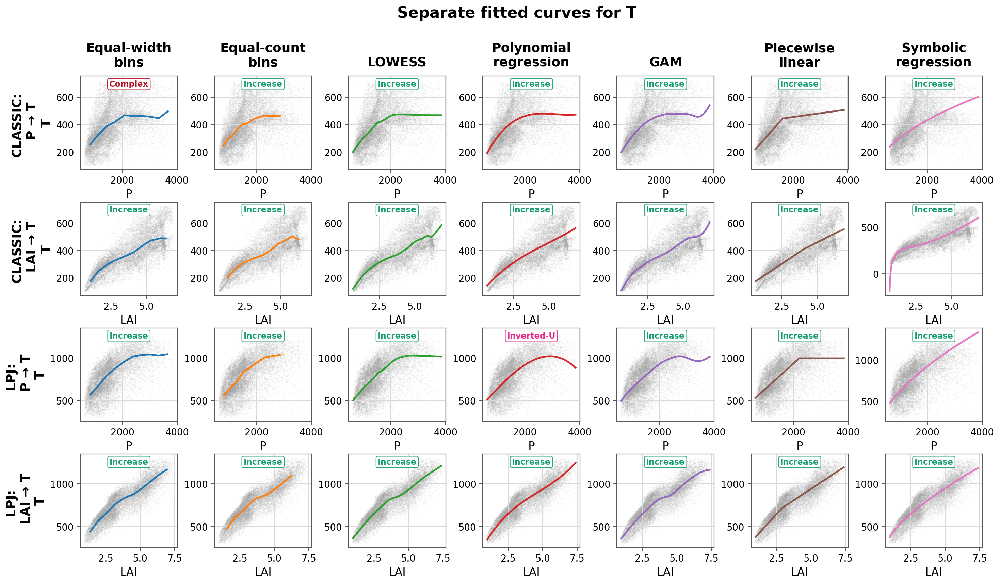

over


In [16]:
# 1. Main shape classification + monotonic subtype
shape_df_t = classify_esm_curves(curve_results_t)
shape_df_t = add_shape_display_column(shape_df_t)
# display(shape_df_t)

# 4. Plot with shape display labels
plot_each_curve_4x7_with_results(
    curve_results_t,
    y_label="T",
    x_labels=("P", "LAI"),
    model_names=("CLASSIC", "LPJ-GUESS"),
    shape_df=shape_df_t,
    show_shape_label=True,
    show_scatter=True,
    line_width=2.0
)

print("over")

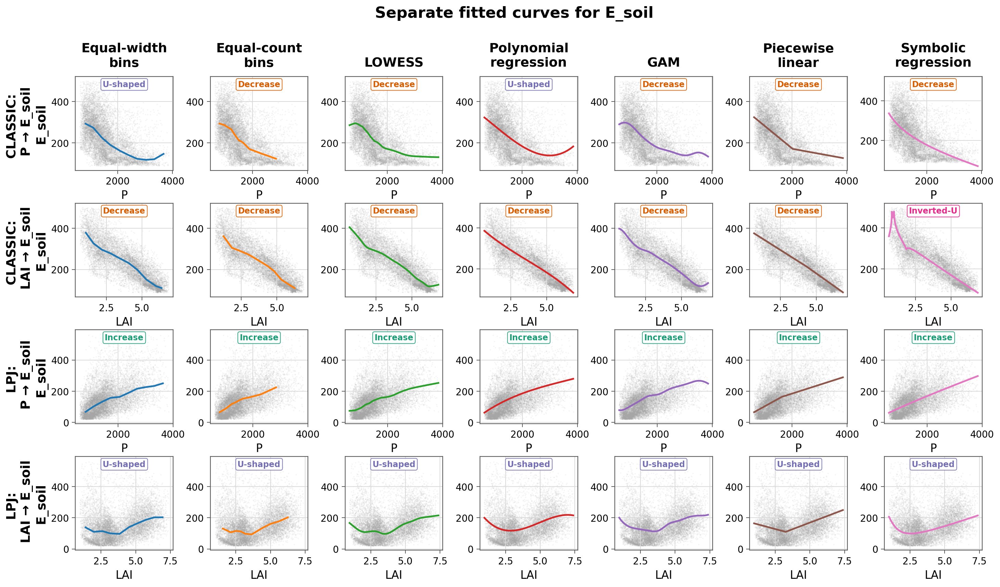

over


In [17]:
# 1. Main shape classification + monotonic subtype
shape_df_esoil = classify_esm_curves(curve_results_esoil)
shape_df_esoil = add_shape_display_column(shape_df_esoil)
# display(shape_df_t)

# 4. Plot with shape display labels
plot_each_curve_4x7_with_results(
    curve_results_esoil,
    y_label="E_soil",
    x_labels=("P", "LAI"),
    model_names=("CLASSIC", "LPJ-GUESS"),
    shape_df=shape_df_esoil,
    show_shape_label=True,
    show_scatter=True,
    line_width=2.0
)

print("over")

In [18]:
def compute_first_derivative(
    x_curve,
    y_curve,
    normalize=True,
    smooth=True,
    smooth_window=5
):
    """
    Compute first derivative dy/dx for one fitted curve.
    """

    x = np.asarray(x_curve, dtype=float)
    y = np.asarray(y_curve, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return {
            "x": x,
            "y": y,
            "x_d": np.array([]),
            "y_d": np.array([]),
            "dy_dx": np.array([]),
            "status": "Insufficient data"
        }

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    unique_mask = np.concatenate([[True], np.diff(x) > 0])
    x = x[unique_mask]
    y = y[unique_mask]

    if len(x) < 5:
        return {
            "x": x,
            "y": y,
            "x_d": np.array([]),
            "y_d": np.array([]),
            "dy_dx": np.array([]),
            "status": "Insufficient data"
        }

    if normalize:
        x_range = np.nanmax(x) - np.nanmin(x)
        y_range = np.nanmax(y) - np.nanmin(y)

        if x_range == 0 or y_range == 0:
            return {
                "x": x,
                "y": y,
                "x_d": np.array([]),
                "y_d": np.array([]),
                "dy_dx": np.array([]),
                "status": "Zero range"
            }

        x_d = (x - np.nanmin(x)) / x_range
        y_d = (y - np.nanmin(y)) / y_range
    else:
        x_d = x.copy()
        y_d = y.copy()

    dy_dx = np.gradient(y_d, x_d)

    if smooth:
        dy_dx = smooth_1d_array(
            dy_dx,
            window=smooth_window
        )

    return {
        "x": x,
        "y": y,
        "x_d": x_d,
        "y_d": y_d,
        "dy_dx": dy_dx,
        "status": "OK"
    }


def smooth_1d_array(arr, window=5):
    arr = np.asarray(arr, dtype=float)

    if window is None or window <= 1 or len(arr) < window:
        return arr

    if window % 2 == 0:
        window += 1

    pad = window // 2
    arr_pad = np.pad(arr, pad_width=pad, mode="edge")
    kernel = np.ones(window) / window

    return np.convolve(arr_pad, kernel, mode="valid")

In [19]:
def compute_first_derivatives_for_curve_results(
    curve_results,
    normalize=True,
    smooth=True,
    smooth_window=5
):
    derivative_results = {}

    for key, result in curve_results.items():
        derivative_results[key] = {}

        for method, curve in result["curves"].items():
            derivative_results[key][method] = compute_first_derivative(
                curve["x"],
                curve["y"],
                normalize=normalize,
                smooth=smooth,
                smooth_window=smooth_window
            )

    return derivative_results

In [20]:
first_derivative_results_t = compute_first_derivatives_for_curve_results(
    curve_results_t,
    normalize=True,
    smooth=True,
    smooth_window=5
)

In [23]:
def plot_all_curves_and_slopes(
    curve_results,
    first_derivative_results,
    y_label="T",
    x_labels=("P", "LAI"),
    model_names=("CLASSIC", "LPJ-GUESS"),
    methods_order=None,
    show_scatter=True,
    sample_size=12000,
    point_size=2,
    point_alpha=0.10,
    curve_line_width=2.1,
    slope_line_width=1.9,
    figsize=(21, 18),
    title_fontsize=15,
    row_label_fontsize=14,
    axis_label_fontsize=11.5,
    tick_fontsize=9.5,
):
    """
    Plot fitted curves and first derivatives in one figure.

    For each relation:
        Row 1: fitted curve
        Row 2: first derivative dy/dx

    Columns:
        fitting methods
    """

    if methods_order is None:
        methods_order = [
            "Equal-width bins",
            "Equal-count bins",
            "LOWESS",
            "Polynomial degree 3",
            "GAM",
            "Piecewise linear",
            "Symbolic regression"
        ]

    method_color_map = {
        "Equal-width bins": "#1f77b4",
        "Equal-count bins": "#ff7f0e",
        "LOWESS": "#2ca02c",
        "Polynomial degree 3": "#d62728",
        "GAM": "#9467bd",
        "Piecewise linear": "#8c564b",
        "Symbolic regression": "#e377c2"
    }

    method_title_map = {
        "Equal-width bins": "Equal-width\nbins",
        "Equal-count bins": "Equal-count\nbins",
        "LOWESS": "LOWESS",
        "Polynomial degree 3": "Polynomial\nregression",
        "GAM": "GAM",
        "Piecewise linear": "Piecewise\nlinear",
        "Symbolic regression": "Symbolic\nregression"
    }

    model_short_map = {
        "CLASSIC": "CLASSIC",
        "LPJ-GUESS": "LPJ"
    }

    # -----------------------------
    # Build relation list
    # -----------------------------
    relation_specs = []

    for model_name in model_names:
        for x_label in x_labels:
            key = (x_label, y_label, model_name)

            if key in curve_results and key in first_derivative_results:
                relation_specs.append((model_name, x_label, y_label, key))

    if len(relation_specs) == 0:
        raise ValueError("No matching relations found.")

    # -----------------------------
    # Keep available methods only
    # -----------------------------
    available_methods = []

    for method in methods_order:
        exists = False

        for _, _, _, key in relation_specs:
            if (
                method in curve_results[key]["curves"]
                and method in first_derivative_results[key]
            ):
                exists = True
                break

        if exists:
            available_methods.append(method)

    methods_order = available_methods

    n_relations = len(relation_specs)
    n_rows = n_relations * 2
    n_cols = len(methods_order)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=figsize,
        dpi=180,
        squeeze=False
    )

    # -----------------------------
    # Plot
    # -----------------------------
    for rel_i, (model_name, x_label, y_label, key) in enumerate(relation_specs):

        curve_row = rel_i * 2
        slope_row = rel_i * 2 + 1

        model_short = model_short_map.get(model_name, model_name)

        result = curve_results[key]
        x_raw = result["x_raw"]
        y_raw = result["y_raw"]
        sub = result["sub"]

        for col, method in enumerate(methods_order):

            color = method_color_map.get(method, "black")

            # =================================================
            # Row 1: fitted curve
            # =================================================
            ax_curve = axes[curve_row, col]

            curve = result["curves"].get(method, None)

            if show_scatter:
                if len(sub) > sample_size:
                    sub_plot = sub.sample(sample_size, random_state=42)
                    x_plot = sub_plot.iloc[:, 0].values
                    y_plot = sub_plot.iloc[:, 1].values
                else:
                    x_plot = x_raw
                    y_plot = y_raw

                ax_curve.scatter(
                    x_plot,
                    y_plot,
                    s=point_size,
                    alpha=point_alpha,
                    color="0.65",
                    linewidths=0,
                    zorder=1
                )

            if curve is not None:
                ax_curve.plot(
                    curve["x"],
                    curve["y"],
                    color=color,
                    linewidth=curve_line_width,
                    zorder=5
                )
            else:
                ax_curve.text(
                    0.5,
                    0.5,
                    "Not available",
                    transform=ax_curve.transAxes,
                    ha="center",
                    va="center",
                    fontsize=axis_label_fontsize,
                    color="0.4"
                )

            if curve_row == 0:
                ax_curve.set_title(
                    method_title_map.get(method, method),
                    fontsize=title_fontsize,
                    fontweight="bold",
                    pad=10
                )

            if col == 0:
                ax_curve.set_ylabel(
                    f"{model_short}:\n{x_label} → {y_label}\n{y_label}",
                    fontsize=row_label_fontsize,
                    fontweight="bold"
                )
            else:
                ax_curve.set_ylabel("")

            ax_curve.set_xlabel(x_label, fontsize=axis_label_fontsize)

            # =================================================
            # Row 2: first derivative / slope
            # =================================================
            ax_slope = axes[slope_row, col]

            deriv = first_derivative_results[key].get(method, None)

            if deriv is not None and deriv.get("status", None) == "OK":
                x_d = deriv["x_d"]
                dy_dx = deriv["dy_dx"]

                ax_slope.plot(
                    x_d,
                    dy_dx,
                    color=color,
                    linewidth=slope_line_width
                )

                ax_slope.axhline(
                    0,
                    color="0.35",
                    linewidth=0.8,
                    linestyle="--"
                )

            else:
                ax_slope.text(
                    0.5,
                    0.5,
                    "Not available",
                    transform=ax_slope.transAxes,
                    ha="center",
                    va="center",
                    fontsize=axis_label_fontsize,
                    color="0.4"
                )

            if col == 0:
                ax_slope.set_ylabel(
                    f"{model_short}:\n{x_label} → {y_label}\n$dy/dx$",
                    fontsize=row_label_fontsize,
                    fontweight="bold"
                )
            else:
                ax_slope.set_ylabel("")

            ax_slope.set_xlabel(
                f"{x_label} normalized",
                fontsize=axis_label_fontsize
            )

            # =================================================
            # Common style
            # =================================================
            for ax in [ax_curve, ax_slope]:
                ax.grid(True, color="0.85", linewidth=0.8)
                ax.set_facecolor("white")

                for side in ["top", "right", "bottom", "left"]:
                    ax.spines[side].set_visible(True)
                    ax.spines[side].set_linewidth(0.8)
                    ax.spines[side].set_color("0.35")

                ax.tick_params(
                    axis="both",
                    labelsize=tick_fontsize,
                    length=3.5,
                    width=0.8,
                    color="0.35"
                )

    fig.suptitle(
        f"Fitted curves and first derivatives for {y_label}",
        fontsize=19,
        fontweight="bold",
        y=0.995
    )

    fig.subplots_adjust(
        wspace=0.35,
        hspace=0.55
    )

    plt.show()

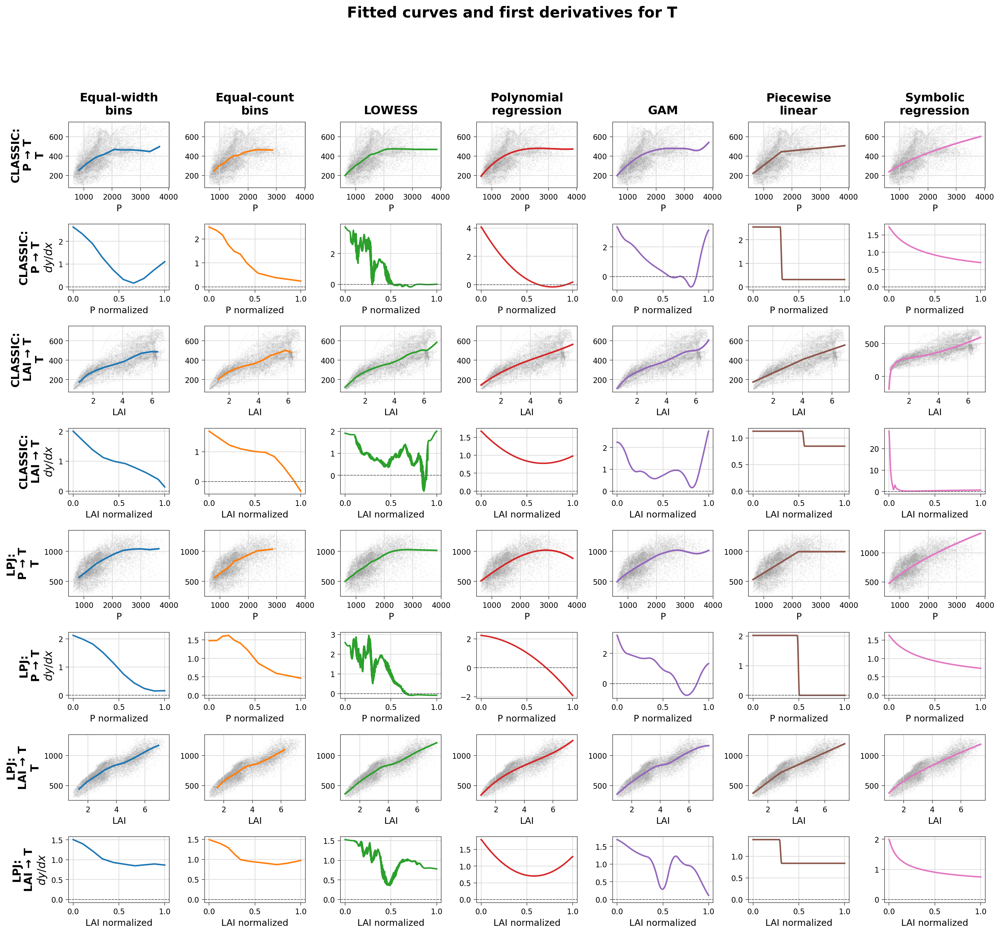

In [24]:
first_derivative_results_t = compute_first_derivatives_for_curve_results(
    curve_results_t,
    normalize=True,
    smooth=True,
    smooth_window=5
)

plot_all_curves_and_slopes(
    curve_results=curve_results_t,
    first_derivative_results=first_derivative_results_t,
    y_label="T",
    x_labels=("P", "LAI"),
    model_names=("CLASSIC", "LPJ-GUESS"),
    show_scatter=True,
    figsize=(21, 18)
)

In [29]:
from scipy.stats import spearmanr, skew

def summarize_curve_slope(
    x_curve,
    y_curve,
    slope_tol=0.03,
    normalize=True
):
    """
    Summarize first-derivative / slope structure for one fitted curve.

    This function does not classify curve shape.
    It only describes slope behavior and geometric diagnostics.
    """

    x = np.asarray(x_curve, dtype=float)
    y = np.asarray(y_curve, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    empty = {
        "n_curve_points": len(x),

        # Basic slope statistics
        "mean_slope": np.nan,
        "median_slope": np.nan,
        "min_slope": np.nan,
        "max_slope": np.nan,
        "slope_std": np.nan,
        "slope_iqr": np.nan,
        "slope_skew": np.nan,
        "slope_cv": np.nan,

        # Slope sign structure
        "pos_fraction": np.nan,
        "neg_fraction": np.nan,
        "flat_fraction": np.nan,
        "mean_slope_sign": np.nan,
        "n_slope_sign_changes": np.nan,

        # Slope trend
        "slope_trend": np.nan,
        "slope_trend_p": np.nan,

        # Stage slopes
        "early_slope": np.nan,
        "middle_slope": np.nan,
        "late_slope": np.nan,
        "terminal_slope": np.nan,
        "first_quartile_slope": np.nan,
        "last_quartile_slope": np.nan,

        # Ratios
        "middle_to_early_ratio": np.nan,
        "late_to_early_ratio": np.nan,
        "terminal_to_early_ratio": np.nan,
        "last_to_first_quartile_ratio": np.nan,

        # Y values and ranges
        "early_y_value": np.nan,
        "middle_y_value": np.nan,
        "late_y_value": np.nan,
        "terminal_y_value": np.nan,
        "early_y_range": np.nan,
        "late_y_range": np.nan,
        "terminal_y_range": np.nan,

        # Path geometry
        "net_change": np.nan,
        "total_variation": np.nan,
        "roughness_ratio": np.nan,

        # Turning-point diagnostics
        "internal_min_idx": np.nan,
        "internal_max_idx": np.nan,
        "internal_min": np.nan,
        "internal_max": np.nan,
        "valley_depth_left": np.nan,
        "valley_depth_right": np.nan,
        "valley_depth_min": np.nan,
        "peak_height_left": np.nan,
        "peak_height_right": np.nan,
        "peak_height_min": np.nan,
    }

    if len(x) < 8:
        return empty

    # Sort by x
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    # Remove duplicated x
    unique_mask = np.concatenate([[True], np.diff(x) > 0])
    x = x[unique_mask]
    y = y[unique_mask]

    if len(x) < 8:
        empty["n_curve_points"] = len(x)
        return empty

    if normalize:
        x_range = float(np.nanmax(x) - np.nanmin(x))
        y_range = float(np.nanmax(y) - np.nanmin(y))

        if x_range == 0 or y_range == 0:
            empty["n_curve_points"] = len(x)
            return empty

        x_use = (x - np.nanmin(x)) / x_range
        y_use = (y - np.nanmin(y)) / y_range
    else:
        x_use = x.copy()
        y_use = y.copy()

    dx = np.diff(x_use)
    dy = np.diff(y_use)

    valid_dx = dx != 0
    slopes = dy[valid_dx] / dx[valid_dx]

    if len(slopes) < 6:
        empty["n_curve_points"] = len(x)
        return empty

    # -----------------------------------------------------
    # Basic slope statistics
    # -----------------------------------------------------
    mean_slope = float(np.nanmean(slopes))
    median_slope = float(np.nanmedian(slopes))
    min_slope = float(np.nanmin(slopes))
    max_slope = float(np.nanmax(slopes))
    slope_std = float(np.nanstd(slopes))

    slope_iqr = float(
        np.nanpercentile(slopes, 75) - np.nanpercentile(slopes, 25)
    )

    if len(slopes) >= 3 and np.nanstd(slopes) > 0:
        slope_skew = float(skew(slopes, nan_policy="omit"))
    else:
        slope_skew = np.nan

    mean_abs_slope = float(np.nanmean(np.abs(slopes)))
    slope_cv = slope_std / (mean_abs_slope + 1e-9)

    # -----------------------------------------------------
    # Slope sign structure
    # -----------------------------------------------------
    signs = np.zeros_like(slopes, dtype=int)
    signs[slopes > slope_tol] = 1
    signs[slopes < -slope_tol] = -1
    signs[np.abs(slopes) <= slope_tol] = 0

    n_segments = len(signs)

    pos_fraction = float(np.sum(signs == 1) / n_segments)
    neg_fraction = float(np.sum(signs == -1) / n_segments)
    flat_fraction = float(np.sum(signs == 0) / n_segments)

    if mean_slope > slope_tol:
        mean_slope_sign = 1
    elif mean_slope < -slope_tol:
        mean_slope_sign = -1
    else:
        mean_slope_sign = 0

    nonzero_signs = signs[signs != 0]

    if len(nonzero_signs) == 0:
        n_slope_sign_changes = 0
    else:
        n_slope_sign_changes = int(
            np.sum(nonzero_signs[1:] != nonzero_signs[:-1])
        )

    # -----------------------------------------------------
    # Slope trend along x
    # Spearman correlation between slope and position.
    # Negative means slope tends to decrease along x.
    # Positive means slope tends to increase along x.
    # -----------------------------------------------------
    if len(slopes) >= 3 and np.nanstd(slopes) > 0:
        slope_trend, slope_trend_p = spearmanr(
            np.arange(len(slopes)),
            slopes,
            nan_policy="omit"
        )
        slope_trend = float(slope_trend)
        slope_trend_p = float(slope_trend_p)
    else:
        slope_trend = np.nan
        slope_trend_p = np.nan

    # -----------------------------------------------------
    # Stage slopes
    # -----------------------------------------------------
    n = len(slopes)

    early = slopes[:max(1, int(0.30 * n))]

    middle_start = int(0.35 * n)
    middle_end = max(middle_start + 1, int(0.65 * n))
    middle = slopes[middle_start:middle_end]

    late = slopes[int(0.70 * n):]
    terminal = slopes[int(0.85 * n):]

    first_quartile = slopes[:max(1, int(0.25 * n))]
    last_quartile = slopes[int(0.75 * n):]

    if len(late) == 0:
        late = slopes[-1:]

    if len(terminal) == 0:
        terminal = slopes[-1:]

    if len(last_quartile) == 0:
        last_quartile = slopes[-1:]

    early_slope = float(np.nanmean(early))
    middle_slope = float(np.nanmean(middle))
    late_slope = float(np.nanmean(late))
    terminal_slope = float(np.nanmean(terminal))

    first_quartile_slope = float(np.nanmedian(first_quartile))
    last_quartile_slope = float(np.nanmedian(last_quartile))

    if abs(early_slope) > 1e-9:
        middle_to_early_ratio = middle_slope / early_slope
        late_to_early_ratio = late_slope / early_slope
        terminal_to_early_ratio = terminal_slope / early_slope
    else:
        middle_to_early_ratio = np.nan
        late_to_early_ratio = np.nan
        terminal_to_early_ratio = np.nan

    if abs(first_quartile_slope) > 1e-9:
        last_to_first_quartile_ratio = (
            last_quartile_slope / first_quartile_slope
        )
    else:
        last_to_first_quartile_ratio = np.nan

    # -----------------------------------------------------
    # Y values and y-ranges
    # -----------------------------------------------------
    n_y = len(y_use)

    early_y_chunk = y_use[:max(1, int(0.25 * n_y))]
    middle_y_chunk = y_use[int(0.35 * n_y):max(int(0.35 * n_y) + 1, int(0.65 * n_y))]
    late_y_chunk = y_use[int(0.75 * n_y):]
    terminal_y_chunk = y_use[int(0.85 * n_y):]

    if len(late_y_chunk) == 0:
        late_y_chunk = y_use[-1:]

    if len(terminal_y_chunk) == 0:
        terminal_y_chunk = y_use[-1:]

    early_y_value = float(np.nanmedian(early_y_chunk))
    middle_y_value = float(np.nanmedian(middle_y_chunk))
    late_y_value = float(np.nanmedian(late_y_chunk))
    terminal_y_value = float(y_use[-1])

    early_y_range = (
        float(np.nanmax(early_y_chunk) - np.nanmin(early_y_chunk))
        if len(early_y_chunk) > 1
        else np.nan
    )

    late_y_range = (
        float(np.nanmax(late_y_chunk) - np.nanmin(late_y_chunk))
        if len(late_y_chunk) > 1
        else np.nan
    )

    terminal_y_range = (
        float(np.nanmax(terminal_y_chunk) - np.nanmin(terminal_y_chunk))
        if len(terminal_y_chunk) > 1
        else np.nan
    )

    # -----------------------------------------------------
    # Path geometry
    # -----------------------------------------------------
    net_change = float(y_use[-1] - y_use[0])
    total_variation = float(np.sum(np.abs(np.diff(y_use))))

    roughness_ratio = (
        total_variation / (abs(net_change) + 1e-9)
        if np.isfinite(net_change)
        else np.nan
    )

    # -----------------------------------------------------
    # Turning-point diagnostics
    # -----------------------------------------------------
    min_idx = int(np.nanargmin(y_use))
    max_idx = int(np.nanargmax(y_use))

    internal_min = 0 < min_idx < len(y_use) - 1
    internal_max = 0 < max_idx < len(y_use) - 1

    valley_depth_left = float(y_use[0] - y_use[min_idx])
    valley_depth_right = float(y_use[-1] - y_use[min_idx])
    valley_depth_min = float(min(valley_depth_left, valley_depth_right))

    peak_height_left = float(y_use[max_idx] - y_use[0])
    peak_height_right = float(y_use[max_idx] - y_use[-1])
    peak_height_min = float(min(peak_height_left, peak_height_right))

    return {
        "n_curve_points": len(x),

        # Basic slope statistics
        "mean_slope": mean_slope,
        "median_slope": median_slope,
        "min_slope": min_slope,
        "max_slope": max_slope,
        "slope_std": slope_std,
        "slope_iqr": slope_iqr,
        "slope_skew": slope_skew,
        "slope_cv": slope_cv,

        # Slope sign structure
        "pos_fraction": pos_fraction,
        "neg_fraction": neg_fraction,
        "flat_fraction": flat_fraction,
        "mean_slope_sign": mean_slope_sign,
        "n_slope_sign_changes": n_slope_sign_changes,

        # Slope trend
        "slope_trend": slope_trend,
        "slope_trend_p": slope_trend_p,

        # Stage slopes
        "early_slope": early_slope,
        "middle_slope": middle_slope,
        "late_slope": late_slope,
        "terminal_slope": terminal_slope,
        "first_quartile_slope": first_quartile_slope,
        "last_quartile_slope": last_quartile_slope,

        # Ratios
        "middle_to_early_ratio": middle_to_early_ratio,
        "late_to_early_ratio": late_to_early_ratio,
        "terminal_to_early_ratio": terminal_to_early_ratio,
        "last_to_first_quartile_ratio": last_to_first_quartile_ratio,

        # Y values and ranges
        "early_y_value": early_y_value,
        "middle_y_value": middle_y_value,
        "late_y_value": late_y_value,
        "terminal_y_value": terminal_y_value,
        "early_y_range": early_y_range,
        "late_y_range": late_y_range,
        "terminal_y_range": terminal_y_range,

        # Path geometry
        "net_change": net_change,
        "total_variation": total_variation,
        "roughness_ratio": roughness_ratio,

        # Turning-point diagnostics
        "internal_min_idx": min_idx,
        "internal_max_idx": max_idx,
        "internal_min": internal_min,
        "internal_max": internal_max,
        "valley_depth_left": valley_depth_left,
        "valley_depth_right": valley_depth_right,
        "valley_depth_min": valley_depth_min,
        "peak_height_left": peak_height_left,
        "peak_height_right": peak_height_right,
        "peak_height_min": peak_height_min,
    }

In [40]:
import numpy as np
import pandas as pd
from scipy import stats


def summarize_curve_slope(
    x_curve,
    y_curve,
    slope_tol=0.03,
    normalize=True,
    store_curve_arrays=True,
    eps=1e-12
):
    """
    Summarize first-derivative behavior of one fitted curve.

    Parameters
    ----------
    x_curve : array-like
        Fitted x values.
    y_curve : array-like
        Fitted y values.
    slope_tol : float
        Threshold used to classify local slopes as positive, negative, or flat.
    normalize : bool
        If True, slopes are calculated from min-max normalized x and y.
    store_curve_arrays : bool
        If True, store x/y normalized curves and slope arrays in the output.
        This is useful for later recalculation or plotting.
    eps : float
        Small value used to avoid division by zero.

    Returns
    -------
    dict
        Curve-level slope summary metrics.
    """

    x = np.asarray(x_curve, dtype=float)
    y = np.asarray(y_curve, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return {
            "n_curve_points": len(x),
            "mean_slope": np.nan,
            "median_slope": np.nan,
            "min_slope": np.nan,
            "max_slope": np.nan,
            "mean_abs_slope": np.nan,
            "median_abs_slope": np.nan,
            "max_abs_slope": np.nan,
            "integrated_abs_slope": np.nan,
            "slope_std": np.nan,
            "slope_iqr": np.nan,
            "slope_skew": np.nan,
            "slope_cv": np.nan,
            "pos_fraction": np.nan,
            "neg_fraction": np.nan,
            "flat_fraction": np.nan,
            "mean_slope_sign": np.nan,
            "n_slope_sign_changes": np.nan,
            "slope_trend": np.nan,
            "slope_trend_p": np.nan,
            "early_slope": np.nan,
            "middle_slope": np.nan,
            "late_slope": np.nan,
            "terminal_slope": np.nan,
            "first_quartile_slope": np.nan,
            "last_quartile_slope": np.nan,
            "middle_to_early_ratio": np.nan,
            "late_to_early_ratio": np.nan,
            "terminal_to_early_ratio": np.nan,
            "last_to_first_quartile_ratio": np.nan,
            "early_y_value": np.nan,
            "middle_y_value": np.nan,
            "late_y_value": np.nan,
            "terminal_y_value": np.nan,
            "early_y_range": np.nan,
            "late_y_range": np.nan,
            "terminal_y_range": np.nan,
            "net_change": np.nan,
            "abs_net_change": np.nan,
            "total_variation": np.nan,
            "roughness_ratio": np.nan,
            "internal_min_idx": np.nan,
            "internal_max_idx": np.nan,
            "internal_min": False,
            "internal_max": False,
            "valley_depth_left": np.nan,
            "valley_depth_right": np.nan,
            "valley_depth_min": np.nan,
            "peak_height_left": np.nan,
            "peak_height_right": np.nan,
            "peak_height_min": np.nan,
        }

    # -----------------------------------------------------
    # 1. Sort by x
    # -----------------------------------------------------
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    # -----------------------------------------------------
    # 2. Normalize x and y if required
    # -----------------------------------------------------
    if normalize:
        x_range = np.nanmax(x) - np.nanmin(x)
        y_range = np.nanmax(y) - np.nanmin(y)

        if x_range > eps:
            x_used = (x - np.nanmin(x)) / x_range
        else:
            x_used = np.full_like(x, np.nan)

        if y_range > eps:
            y_used = (y - np.nanmin(y)) / y_range
        else:
            y_used = np.full_like(y, np.nan)
    else:
        x_used = x.copy()
        y_used = y.copy()

    valid_norm = np.isfinite(x_used) & np.isfinite(y_used)
    x_used = x_used[valid_norm]
    y_used = y_used[valid_norm]

    if len(x_used) < 5:
        return {
            "n_curve_points": len(x_used),
            "mean_slope": np.nan,
            "median_slope": np.nan,
            "min_slope": np.nan,
            "max_slope": np.nan,
            "mean_abs_slope": np.nan,
            "median_abs_slope": np.nan,
            "max_abs_slope": np.nan,
            "integrated_abs_slope": np.nan,
            "slope_std": np.nan,
            "slope_iqr": np.nan,
            "slope_skew": np.nan,
            "slope_cv": np.nan,
            "pos_fraction": np.nan,
            "neg_fraction": np.nan,
            "flat_fraction": np.nan,
            "mean_slope_sign": np.nan,
            "n_slope_sign_changes": np.nan,
            "slope_trend": np.nan,
            "slope_trend_p": np.nan,
            "early_slope": np.nan,
            "middle_slope": np.nan,
            "late_slope": np.nan,
            "terminal_slope": np.nan,
            "first_quartile_slope": np.nan,
            "last_quartile_slope": np.nan,
            "middle_to_early_ratio": np.nan,
            "late_to_early_ratio": np.nan,
            "terminal_to_early_ratio": np.nan,
            "last_to_first_quartile_ratio": np.nan,
            "early_y_value": np.nan,
            "middle_y_value": np.nan,
            "late_y_value": np.nan,
            "terminal_y_value": np.nan,
            "early_y_range": np.nan,
            "late_y_range": np.nan,
            "terminal_y_range": np.nan,
            "net_change": np.nan,
            "abs_net_change": np.nan,
            "total_variation": np.nan,
            "roughness_ratio": np.nan,
            "internal_min_idx": np.nan,
            "internal_max_idx": np.nan,
            "internal_min": False,
            "internal_max": False,
            "valley_depth_left": np.nan,
            "valley_depth_right": np.nan,
            "valley_depth_min": np.nan,
            "peak_height_left": np.nan,
            "peak_height_right": np.nan,
            "peak_height_min": np.nan,
        }

    # -----------------------------------------------------
    # 3. Local slopes
    # -----------------------------------------------------
    dx = np.diff(x_used)
    dy = np.diff(y_used)

    valid_slope = np.isfinite(dx) & np.isfinite(dy) & (np.abs(dx) > eps)

    slope_values = dy[valid_slope] / dx[valid_slope]
    x_mid = 0.5 * (x_used[:-1][valid_slope] + x_used[1:][valid_slope])

    slope_values = slope_values[np.isfinite(slope_values)]
    x_mid = x_mid[:len(slope_values)]

    if len(slope_values) == 0:
        abs_slope_values = np.array([])
    else:
        abs_slope_values = np.abs(slope_values)

    # -----------------------------------------------------
    # 4. Basic slope magnitude metrics
    # -----------------------------------------------------
    if len(slope_values) > 0:
        mean_slope = np.nanmean(slope_values)
        median_slope = np.nanmedian(slope_values)
        min_slope = np.nanmin(slope_values)
        max_slope = np.nanmax(slope_values)

        mean_abs_slope = np.nanmean(abs_slope_values)
        median_abs_slope = np.nanmedian(abs_slope_values)
        max_abs_slope = np.nanmax(abs_slope_values)

        slope_std = np.nanstd(slope_values)
        slope_iqr = np.nanpercentile(slope_values, 75) - np.nanpercentile(slope_values, 25)

        if len(slope_values) >= 3:
            slope_skew = stats.skew(slope_values, nan_policy="omit")
        else:
            slope_skew = np.nan

        if abs(mean_slope) > eps:
            slope_cv = slope_std / abs(mean_slope)
        else:
            slope_cv = np.nan

        if len(x_mid) > 1:
            integrated_abs_slope = np.trapz(abs_slope_values, x_mid)
        else:
            integrated_abs_slope = np.nan
    else:
        mean_slope = np.nan
        median_slope = np.nan
        min_slope = np.nan
        max_slope = np.nan
        mean_abs_slope = np.nan
        median_abs_slope = np.nan
        max_abs_slope = np.nan
        integrated_abs_slope = np.nan
        slope_std = np.nan
        slope_iqr = np.nan
        slope_skew = np.nan
        slope_cv = np.nan

    # -----------------------------------------------------
    # 5. Slope sign structure
    # -----------------------------------------------------
    if len(slope_values) > 0:
        slope_sign = np.zeros_like(slope_values, dtype=int)
        slope_sign[slope_values > slope_tol] = 1
        slope_sign[slope_values < -slope_tol] = -1

        pos_fraction = np.mean(slope_sign == 1)
        neg_fraction = np.mean(slope_sign == -1)
        flat_fraction = np.mean(slope_sign == 0)

        if np.isfinite(mean_slope):
            if mean_slope > slope_tol:
                mean_slope_sign = 1
            elif mean_slope < -slope_tol:
                mean_slope_sign = -1
            else:
                mean_slope_sign = 0
        else:
            mean_slope_sign = np.nan

        nonzero_signs = slope_sign[slope_sign != 0]

        if len(nonzero_signs) >= 2:
            n_slope_sign_changes = np.sum(nonzero_signs[1:] != nonzero_signs[:-1])
        else:
            n_slope_sign_changes = 0
    else:
        pos_fraction = np.nan
        neg_fraction = np.nan
        flat_fraction = np.nan
        mean_slope_sign = np.nan
        n_slope_sign_changes = np.nan

    # -----------------------------------------------------
    # 6. Slope trend across x
    # -----------------------------------------------------
    if len(slope_values) >= 3 and len(x_mid) == len(slope_values):
        trend_result = stats.linregress(x_mid, slope_values)
        slope_trend = trend_result.slope
        slope_trend_p = trend_result.pvalue
    else:
        slope_trend = np.nan
        slope_trend_p = np.nan

    # -----------------------------------------------------
    # 7. Segment-wise slope summaries
    # -----------------------------------------------------
    def mean_slope_in_range(x_pos, slopes, lo, hi):
        mask = (x_pos >= lo) & (x_pos <= hi)
        if np.any(mask):
            return np.nanmean(slopes[mask])
        return np.nan

    early_slope = mean_slope_in_range(x_mid, slope_values, 0.00, 0.25)
    middle_slope = mean_slope_in_range(x_mid, slope_values, 0.25, 0.75)
    late_slope = mean_slope_in_range(x_mid, slope_values, 0.75, 1.00)
    terminal_slope = mean_slope_in_range(x_mid, slope_values, 0.90, 1.00)

    first_quartile_slope = mean_slope_in_range(x_mid, slope_values, 0.00, 0.25)
    last_quartile_slope = mean_slope_in_range(x_mid, slope_values, 0.75, 1.00)

    def safe_ratio(a, b):
        if np.isfinite(a) and np.isfinite(b) and abs(b) > eps:
            return a / b
        return np.nan

    middle_to_early_ratio = safe_ratio(middle_slope, early_slope)
    late_to_early_ratio = safe_ratio(late_slope, early_slope)
    terminal_to_early_ratio = safe_ratio(terminal_slope, early_slope)
    last_to_first_quartile_ratio = safe_ratio(last_quartile_slope, first_quartile_slope)

    # -----------------------------------------------------
    # 8. Segment-wise y summaries
    # -----------------------------------------------------
    def mean_y_in_range(x_pos, y_pos, lo, hi):
        mask = (x_pos >= lo) & (x_pos <= hi)
        if np.any(mask):
            return np.nanmean(y_pos[mask])
        return np.nan

    def range_y_in_range(x_pos, y_pos, lo, hi):
        mask = (x_pos >= lo) & (x_pos <= hi)
        if np.any(mask):
            return np.nanmax(y_pos[mask]) - np.nanmin(y_pos[mask])
        return np.nan

    early_y_value = mean_y_in_range(x_used, y_used, 0.00, 0.25)
    middle_y_value = mean_y_in_range(x_used, y_used, 0.25, 0.75)
    late_y_value = mean_y_in_range(x_used, y_used, 0.75, 1.00)
    terminal_y_value = mean_y_in_range(x_used, y_used, 0.90, 1.00)

    early_y_range = range_y_in_range(x_used, y_used, 0.00, 0.25)
    late_y_range = range_y_in_range(x_used, y_used, 0.75, 1.00)
    terminal_y_range = range_y_in_range(x_used, y_used, 0.90, 1.00)

    # -----------------------------------------------------
    # 9. Net change and total variation
    # -----------------------------------------------------
    if len(y_used) >= 2:
        net_change = y_used[-1] - y_used[0]
        abs_net_change = abs(net_change)
        total_variation = np.sum(np.abs(np.diff(y_used)))
    else:
        net_change = np.nan
        abs_net_change = np.nan
        total_variation = np.nan

    if np.isfinite(total_variation) and abs_net_change > eps:
        roughness_ratio = total_variation / abs_net_change
    else:
        roughness_ratio = np.nan

    # -----------------------------------------------------
    # 10. Internal minimum / maximum
    # -----------------------------------------------------
    internal_min_idx = int(np.nanargmin(y_used)) if len(y_used) > 0 else np.nan
    internal_max_idx = int(np.nanargmax(y_used)) if len(y_used) > 0 else np.nan

    internal_min = (
        np.isfinite(internal_min_idx)
        and internal_min_idx > 0
        and internal_min_idx < len(y_used) - 1
    )

    internal_max = (
        np.isfinite(internal_max_idx)
        and internal_max_idx > 0
        and internal_max_idx < len(y_used) - 1
    )

    if internal_min:
        y_min = y_used[internal_min_idx]
        valley_depth_left = y_used[0] - y_min
        valley_depth_right = y_used[-1] - y_min
        valley_depth_min = min(valley_depth_left, valley_depth_right)
    else:
        valley_depth_left = 0.0
        valley_depth_right = 0.0
        valley_depth_min = 0.0

    if internal_max:
        y_max = y_used[internal_max_idx]
        peak_height_left = y_max - y_used[0]
        peak_height_right = y_max - y_used[-1]
        peak_height_min = min(peak_height_left, peak_height_right)
    else:
        peak_height_left = 0.0
        peak_height_right = 0.0
        peak_height_min = 0.0

    # -----------------------------------------------------
    # 11. Build output
    # -----------------------------------------------------
    summary = {
        "n_curve_points": len(x_used),

        # Slope magnitude
        "mean_slope": mean_slope,
        "median_slope": median_slope,
        "min_slope": min_slope,
        "max_slope": max_slope,
        "mean_abs_slope": mean_abs_slope,
        "median_abs_slope": median_abs_slope,
        "max_abs_slope": max_abs_slope,
        "integrated_abs_slope": integrated_abs_slope,

        # Slope distribution
        "slope_std": slope_std,
        "slope_iqr": slope_iqr,
        "slope_skew": slope_skew,
        "slope_cv": slope_cv,

        # Directional structure
        "pos_fraction": pos_fraction,
        "neg_fraction": neg_fraction,
        "flat_fraction": flat_fraction,
        "mean_slope_sign": mean_slope_sign,
        "n_slope_sign_changes": n_slope_sign_changes,

        # Slope trend
        "slope_trend": slope_trend,
        "slope_trend_p": slope_trend_p,

        # Local slope
        "early_slope": early_slope,
        "middle_slope": middle_slope,
        "late_slope": late_slope,
        "terminal_slope": terminal_slope,
        "first_quartile_slope": first_quartile_slope,
        "last_quartile_slope": last_quartile_slope,

        # Local slope ratios
        "middle_to_early_ratio": middle_to_early_ratio,
        "late_to_early_ratio": late_to_early_ratio,
        "terminal_to_early_ratio": terminal_to_early_ratio,
        "last_to_first_quartile_ratio": last_to_first_quartile_ratio,

        # Local y values
        "early_y_value": early_y_value,
        "middle_y_value": middle_y_value,
        "late_y_value": late_y_value,
        "terminal_y_value": terminal_y_value,
        "early_y_range": early_y_range,
        "late_y_range": late_y_range,
        "terminal_y_range": terminal_y_range,

        # Overall response magnitude
        "net_change": net_change,
        "abs_net_change": abs_net_change,
        "total_variation": total_variation,
        "roughness_ratio": roughness_ratio,

        # Turning points
        "internal_min_idx": internal_min_idx,
        "internal_max_idx": internal_max_idx,
        "internal_min": internal_min,
        "internal_max": internal_max,
        "valley_depth_left": valley_depth_left,
        "valley_depth_right": valley_depth_right,
        "valley_depth_min": valley_depth_min,
        "peak_height_left": peak_height_left,
        "peak_height_right": peak_height_right,
        "peak_height_min": peak_height_min,

        # Documentation
        "slope_scale": "normalized" if normalize else "raw",
    }

    # -----------------------------------------------------
    # 12. Optional: store full curve arrays
    # -----------------------------------------------------
    if store_curve_arrays:
        summary.update({
            "x_curve": x,
            "y_curve": y,
            "x_curve_used": x_used,
            "y_curve_used": y_used,
            "slope_values": slope_values,
            "abs_slope_values": abs_slope_values,
            "x_mid": x_mid,
        })

    return summary


def make_slope_summary_table(
    curve_results,
    slope_tol=0.03,
    normalize=True,
    store_curve_arrays=True,
    round_numeric=True
):
    """
    Generate slope summary table for all fitted curves.

    Each row:
        model × x → y × fitting method

    Each column:
        first-derivative summary metric

    Parameters
    ----------
    curve_results : dict
        Dictionary containing fitted curve results.
    slope_tol : float
        Threshold for classifying local slopes as positive, negative, or flat.
    normalize : bool
        If True, calculate slopes using min-max normalized x and y.
    store_curve_arrays : bool
        If True, keep full x/y/slope arrays in the DataFrame.
        Recommended if you want to save the object as pickle.
    round_numeric : bool
        If True, round numeric columns to 3 decimals.
        Recommended for display tables, but not for intermediate computation.

    Returns
    -------
    pd.DataFrame
        Slope summary table.
    """

    records = []

    for key, result in curve_results.items():
        x_label, y_label, model_name = key

        for method, curve in result["curves"].items():
            slope_summary = summarize_curve_slope(
                x_curve=curve["x"],
                y_curve=curve["y"],
                slope_tol=slope_tol,
                normalize=normalize,
                store_curve_arrays=store_curve_arrays
            )

            records.append({
                "model": model_name,
                "x": x_label,
                "y": y_label,
                "method": method,
                **slope_summary
            })

    slope_summary_table = pd.DataFrame(records)

    if round_numeric:
        num_cols = slope_summary_table.select_dtypes(include="number").columns
        slope_summary_table[num_cols] = slope_summary_table[num_cols].round(4)

    return slope_summary_table

In [41]:
slope_summary_t = make_slope_summary_table(
    curve_results=curve_results_t,
    slope_tol=0.03,
    normalize=True,
    store_curve_arrays=False,
    round_numeric=True
)

from pathlib import Path

out_dir = Path("./slope_output")
out_dir.mkdir(parents=True, exist_ok=True)

slope_summary_t.to_csv(
    out_dir / "slope_summary_t.csv",
    index=False,
    encoding="utf-8-sig"
)

slope_summary_t

,model,x,y,method,n_curve_points,mean_slope,median_slope,min_slope,max_slope,mean_abs_slope,...,internal_max_idx,internal_min,internal_max,valley_depth_left,valley_depth_right,valley_depth_min,peak_height_left,peak_height_right,peak_height_min,slope_scale
0,CLASSIC,P,T,Equal-width bins,10,1.0097,1.2105,-0.4041,2.9053,1.1916,...,9,False,False,0.0,0.0,0.0,0.0,0.0000,0.0000,normalized
1,CLASSIC,P,T,Equal-count bins,10,1.3717,1.3735,-0.0545,2.9256,1.3838,...,8,False,True,0.0,0.0,0.0,1.0,0.0150,0.0150,normalized
2,CLASSIC,P,T,LOWESS,12035,1.8005,2.1924,-0.1699,3.7291,1.8170,...,10297,False,True,0.0,0.0,0.0,1.0,0.0213,0.0213,normalized
3,CLASSIC,P,T,Polynomial degree 3,300,0.9754,0.3894,-0.1561,4.0876,1.0374,...,188,False,True,0.0,0.0,0.0,1.0,0.0246,0.0246,normalized
4,CLASSIC,P,T,GAM,300,1.0000,0.7646,-0.7024,3.3666,1.1311,...,299,False,False,0.0,0.0,0.0,0.0,0.0000,0.0000,normalized
5,CLASSIC,P,T,Piecewise linear,300,1.0000,0.3129,0.3129,2.5419,1.0000,...,299,False,False,0.0,0.0,0.0,0.0,0.0000,0.0000,normalized
6,CLASSIC,P,T,Symbolic regression,300,1.0000,0.9201,0.7019,1.7336,1.0000,...,299,False,False,0.0,0.0,0.0,0.0,0.0000,0.0000,normalized
7,LPJ-GUESS,P,T,Equal-width bins,10,1.0108,1.1264,-0.2507,2.2549,1.0665,...,9,False,False,0.0,0.0,0.0,0.0,0.0000,0.0000,normalized
8,LPJ-GUESS,P,T,Equal-count bins,10,1.2662,1.1397,0.2348,2.2298,1.2662,...,9,False,False,0.0,0.0,0.0,0.0,0.0000,0.0000,normalized
9,LPJ-GUESS,P,T,LOWESS,12139,1.6296,1.7900,-0.0842,2.9623,1.6373,...,11438,False,True,0.0,0.0,0.0,1.0,0.0231,0.0231,normalized


In [42]:
import pandas as pd
import numpy as np
from pathlib import Path


# ============================================================
# 1. Read original T slope summary table
# ============================================================

input_path = Path("./slope_output/slope_summary_t.csv")

output_csv_path = Path("./slope_output/relationship_descriptor_summary_t.csv")
output_excel_path = Path("./slope_output/relationship_descriptor_summary_t.xlsx")

slope_summary_t = pd.read_csv(input_path)


# ============================================================
# 2. Helper functions
# ============================================================

def safe_divide(a, b):
    a = pd.to_numeric(a, errors="coerce")
    b = pd.to_numeric(b, errors="coerce")
    return np.where((b == 0) | (~np.isfinite(b)), np.nan, a / b)


def ensure_column(df, col, default=np.nan):
    if col not in df.columns:
        df[col] = default
    return df


# ============================================================
# 3. Prepare base dataframe
# ============================================================

descriptor_df_t = slope_summary_t.copy()

# Mark this table as the descriptor summary for T
descriptor_df_t["target_output"] = "T"


# If your original table uses zone instead of climate_zone
if "climate_zone" not in descriptor_df_t.columns and "zone" in descriptor_df_t.columns:
    descriptor_df_t["climate_zone"] = descriptor_df_t["zone"]

base_cols = [
    "model", "x", "y", "method", "climate_zone", "n_points",
    "mean_slope", "mean_slope_sign",
    "pos_fraction", "neg_fraction", "flat_fraction",
    "n_slope_sign_changes",
    "slope_trend", "slope_trend_p",
    "early_slope", "middle_slope", "late_slope", "terminal_slope",
    "middle_to_early_ratio", "late_to_early_ratio", "terminal_to_early_ratio",
    "early_y_value", "late_y_value", "terminal_y_value",
    "early_y_range", "late_y_range", "terminal_y_range",
    "roughness_ratio", "slope_std", "slope_iqr",
    "internal_min", "internal_max",
    "valley_depth_min", "peak_height_min"
]

for col in base_cols:
    descriptor_df_t = ensure_column(descriptor_df_t, col)


# ============================================================
# 4. Construct descriptor-level numerical metrics for T
# ============================================================

# ----------------------------
# A. Overall direction
# ----------------------------

if "first_y_value" in descriptor_df_t.columns and "last_y_value" in descriptor_df_t.columns:
    descriptor_df_t["net_change_norm"] = (
        pd.to_numeric(descriptor_df_t["last_y_value"], errors="coerce")
        - pd.to_numeric(descriptor_df_t["first_y_value"], errors="coerce")
    )
else:
    descriptor_df_t["net_change_norm"] = (
        pd.to_numeric(descriptor_df_t["late_y_value"], errors="coerce")
        - pd.to_numeric(descriptor_df_t["early_y_value"], errors="coerce")
    )

descriptor_df_t["mean_slope_norm"] = pd.to_numeric(
    descriptor_df_t["mean_slope"], errors="coerce"
)

descriptor_df_t["direction_consistency"] = (
    pd.to_numeric(descriptor_df_t["pos_fraction"], errors="coerce")
    - pd.to_numeric(descriptor_df_t["neg_fraction"], errors="coerce")
).abs()


# ----------------------------
# B. Dominant curvature
# ----------------------------

descriptor_df_t["curvature_score"] = pd.to_numeric(
    descriptor_df_t["slope_trend"], errors="coerce"
)

descriptor_df_t["linear_deviation"] = pd.to_numeric(
    descriptor_df_t["slope_iqr"], errors="coerce"
)

descriptor_df_t["curvature_consistency"] = 1 - pd.to_numeric(
    descriptor_df_t["slope_trend_p"], errors="coerce"
)
descriptor_df_t["curvature_consistency"] = descriptor_df_t["curvature_consistency"].clip(0, 1)


# ----------------------------
# C. Marginal-response pattern
# ----------------------------

descriptor_df_t["early_slope_norm"] = pd.to_numeric(
    descriptor_df_t["early_slope"], errors="coerce"
)

descriptor_df_t["middle_slope_norm"] = pd.to_numeric(
    descriptor_df_t["middle_slope"], errors="coerce"
)

descriptor_df_t["late_slope_norm"] = pd.to_numeric(
    descriptor_df_t["late_slope"], errors="coerce"
)

descriptor_df_t["middle_to_early_ratio"] = pd.to_numeric(
    descriptor_df_t["middle_to_early_ratio"], errors="coerce"
)

descriptor_df_t["late_to_early_ratio"] = pd.to_numeric(
    descriptor_df_t["late_to_early_ratio"], errors="coerce"
)

descriptor_df_t["marginal_variation"] = descriptor_df_t[
    ["early_slope_norm", "middle_slope_norm", "late_slope_norm"]
].std(axis=1, skipna=True)


# ----------------------------
# D. Terminal behavior
# ----------------------------

descriptor_df_t["terminal_slope_norm"] = pd.to_numeric(
    descriptor_df_t["terminal_slope"], errors="coerce"
)

descriptor_df_t["terminal_to_early_ratio"] = pd.to_numeric(
    descriptor_df_t["terminal_to_early_ratio"], errors="coerce"
)

descriptor_df_t["terminal_to_mean_ratio"] = safe_divide(
    descriptor_df_t["terminal_slope_norm"],
    descriptor_df_t["mean_slope_norm"].abs()
)

descriptor_df_t["terminal_y_range_norm"] = pd.to_numeric(
    descriptor_df_t["terminal_y_range"], errors="coerce"
)

descriptor_df_t["terminal_flat_fraction"] = np.nan


# ----------------------------
# E. Turning complexity
# ----------------------------

descriptor_df_t["n_slope_sign_changes"] = pd.to_numeric(
    descriptor_df_t["n_slope_sign_changes"], errors="coerce"
)

descriptor_df_t["valley_depth"] = pd.to_numeric(
    descriptor_df_t["valley_depth_min"], errors="coerce"
)

descriptor_df_t["peak_height"] = pd.to_numeric(
    descriptor_df_t["peak_height_min"], errors="coerce"
)

descriptor_df_t["turning_strength"] = descriptor_df_t[
    ["valley_depth", "peak_height"]
].max(axis=1, skipna=True)

descriptor_df_t["roughness_ratio"] = pd.to_numeric(
    descriptor_df_t["roughness_ratio"], errors="coerce"
)

descriptor_df_t["internal_min_num"] = descriptor_df_t["internal_min"].astype(str).str.lower().isin(
    ["true", "1", "yes"]
).astype(int)

descriptor_df_t["internal_max_num"] = descriptor_df_t["internal_max"].astype(str).str.lower().isin(
    ["true", "1", "yes"]
).astype(int)

descriptor_df_t["n_internal_extrema"] = (
    descriptor_df_t["internal_min_num"] + descriptor_df_t["internal_max_num"]
)


# ============================================================
# 5. Define five-descriptor summary table structure for T
# ============================================================

column_groups_t = {
    "Basic information": [
        "target_output",
        "model",
        "x",
        "y",
        "method",
        "climate_zone",
        "n_points",
    ],

    "Overall direction": [
        "net_change_norm",
        "mean_slope_norm",
        "pos_fraction",
        "neg_fraction",
        "flat_fraction",
        "direction_consistency",
    ],

    "Dominant curvature": [
        "slope_trend",
        "curvature_score",
        "linear_deviation",
        "curvature_consistency",
    ],

    "Marginal-response pattern": [
        "early_slope_norm",
        "middle_slope_norm",
        "late_slope_norm",
        "middle_to_early_ratio",
        "late_to_early_ratio",
        "marginal_variation",
    ],

    "Terminal behavior": [
        "terminal_slope_norm",
        "terminal_to_early_ratio",
        "terminal_to_mean_ratio",
        "terminal_y_range_norm",
        "terminal_flat_fraction",
    ],

    "Turning complexity": [
        "n_slope_sign_changes",
        "n_internal_extrema",
        "turning_strength",
        "valley_depth",
        "peak_height",
        "roughness_ratio",
    ],
}


ordered_cols_t = []
for group, cols in column_groups_t.items():
    ordered_cols_t.extend(cols)

for col in ordered_cols_t:
    descriptor_df_t = ensure_column(descriptor_df_t, col)

relationship_descriptor_summary_t = descriptor_df_t[ordered_cols_t].copy()


# ============================================================
# 6. Export CSV for computation
# ============================================================

relationship_descriptor_summary_t.to_csv(output_csv_path, index=False)

print(f"Saved T relationship descriptor summary CSV to: {output_csv_path}")


# ============================================================
# 7. Optional: export Excel with grouped headers
# ============================================================

multi_cols_t = []
for group, cols in column_groups_t.items():
    for col in cols:
        multi_cols_t.append((group, col))

excel_df_t = relationship_descriptor_summary_t.copy()
excel_df_t.columns = pd.MultiIndex.from_tuples(multi_cols_t)

excel_df_t.to_excel(output_excel_path, index=True)

print(f"Saved T relationship descriptor summary Excel to: {output_excel_path}")




Saved T relationship descriptor summary CSV to: slope_output/relationship_descriptor_summary_t.csv
Saved T relationship descriptor summary Excel to: slope_output/relationship_descriptor_summary_t.xlsx


In [38]:
import numpy as np
import pandas as pd


def make_layer1_within_curve_table(
    slope_summary,
    slope_trend_weak=-0.4,
    slope_trend_acc=0.4,
    weak_ratio_threshold=0.7,
    acc_ratio_threshold=1.3,
    linear_ratio_lower=0.8,
    linear_ratio_upper=1.25,
    terminal_flat_threshold=0.10,
    roughness_threshold=2.0,
    sign_change_threshold=2,
    use_elasticity=False,
    elasticity_epsilon=1e-6
):
    """
    Layer 1: within-curve characterization.

    Each row represents one fitted curve from one fitting method.

    The output gives curve-level descriptors:
    - directional structure
    - marginal-response variation
    - terminal behavior
    - irregularity / turning structure
    - response-strength metrics

    Notes
    -----
    This function does not make final model-level conclusions.

    Strength metrics are calculated from normalized slopes when available.
    Therefore, they describe relative response intensity rather than
    raw-unit response intensity.

    Recommended upstream normalization:
        x_norm = (x - min(x)) / (max(x) - min(x))
        y_norm = (y - min(y)) / (max(y) - min(y))
        slope = dy_norm / dx_norm
    """

    df = slope_summary.copy()

    # -----------------------------------------------------
    # 0. Helper functions
    # -----------------------------------------------------
    def _to_array(value):
        """
        Safely convert list-like values to numpy arrays.
        Returns None if the value is missing or not array-like.
        """
        if value is None:
            return None

        if isinstance(value, str):
            return None

        try:
            arr = np.asarray(value, dtype=float)
            arr = arr[np.isfinite(arr)]
            if arr.size == 0:
                return None
            return arr
        except Exception:
            return None

    def _safe_abs(value):
        if np.isfinite(value):
            return abs(value)
        return np.nan

    # -----------------------------------------------------
    # 1. Directional structure
    # -----------------------------------------------------
    def infer_direction(row):
        if row["pos_fraction"] >= 0.70:
            return "Mostly increasing"
        elif row["neg_fraction"] >= 0.70:
            return "Mostly decreasing"
        elif row["flat_fraction"] >= 0.70:
            return "Mostly flat"
        else:
            return "Directionally mixed"

    df["direction_descriptor"] = df.apply(infer_direction, axis=1)

    # -----------------------------------------------------
    # 2. Marginal-response variation
    # -----------------------------------------------------
    def infer_marginal_pattern(row):
        slope_trend = row.get("slope_trend", np.nan)
        late_ratio = row.get("late_to_early_ratio", np.nan)
        terminal_ratio = row.get("terminal_to_early_ratio", np.nan)

        weakening_evidence = (
            (np.isfinite(slope_trend) and slope_trend <= slope_trend_weak)
            or (np.isfinite(late_ratio) and late_ratio <= weak_ratio_threshold)
            or (np.isfinite(terminal_ratio) and terminal_ratio <= weak_ratio_threshold)
        )

        accelerating_evidence = (
            (np.isfinite(slope_trend) and slope_trend >= slope_trend_acc)
            or (np.isfinite(late_ratio) and late_ratio >= acc_ratio_threshold)
            or (np.isfinite(terminal_ratio) and terminal_ratio >= acc_ratio_threshold)
        )

        near_linear_evidence = (
            np.isfinite(late_ratio)
            and linear_ratio_lower <= late_ratio <= linear_ratio_upper
            and np.isfinite(terminal_ratio)
            and linear_ratio_lower <= terminal_ratio <= linear_ratio_upper
        )

        if weakening_evidence and not accelerating_evidence:
            return "Weakening marginal response"
        elif accelerating_evidence and not weakening_evidence:
            return "Strengthening marginal response"
        elif near_linear_evidence:
            return "Approximately stable marginal response"
        elif weakening_evidence and accelerating_evidence:
            return "Mixed marginal response"
        else:
            return "Unclear marginal-response pattern"

    df["marginal_response_descriptor"] = df.apply(
        infer_marginal_pattern,
        axis=1
    )

    # -----------------------------------------------------
    # 3. Terminal behavior
    # -----------------------------------------------------
    def infer_terminal_behavior(row):
        terminal_y_range = row.get("terminal_y_range", np.nan)
        terminal_slope = row.get("terminal_slope", np.nan)

        terminal_flat = (
            np.isfinite(terminal_y_range)
            and terminal_y_range <= terminal_flat_threshold
        )

        if terminal_flat and np.isfinite(terminal_slope):
            if abs(terminal_slope) <= 0.05:
                return "Terminal plateau"
            else:
                return "Small terminal change"
        elif terminal_flat:
            return "Small terminal change"
        else:
            return "No clear terminal plateau"

    df["terminal_descriptor"] = df.apply(
        infer_terminal_behavior,
        axis=1
    )

    # -----------------------------------------------------
    # 4. Irregularity / turning structure
    # -----------------------------------------------------
    def infer_irregularity(row):
        roughness = row.get("roughness_ratio", np.nan)
        n_changes = row.get("n_slope_sign_changes", np.nan)
        internal_min = row.get("internal_min", False)
        internal_max = row.get("internal_max", False)

        rough = (
            np.isfinite(roughness)
            and roughness >= roughness_threshold
        )

        many_sign_changes = (
            np.isfinite(n_changes)
            and n_changes >= sign_change_threshold
        )

        if rough and many_sign_changes:
            return "Irregular / oscillatory"
        elif internal_min and internal_max:
            return "Multiple turning features"
        elif internal_min:
            return "Internal valley"
        elif internal_max:
            return "Internal peak"
        elif rough or many_sign_changes:
            return "Locally variable"
        else:
            return "Geometrically simple"

    df["irregularity_descriptor"] = df.apply(
        infer_irregularity,
        axis=1
    )

    # -----------------------------------------------------
    # 5. Response-strength metrics
    # -----------------------------------------------------
    def add_strength_metrics(row):
        """
        Calculate response-strength metrics.

        Preferred:
            If slope_values exists, use all local slopes.

        Fallback:
            Use available summary slopes:
            early_slope, middle_slope, late_slope, terminal_slope.

        Interpretation:
            These are normalized-slope-based metrics if the upstream
            slopes were computed from x_norm and y_norm.
        """

        slope_values = _to_array(row.get("slope_values", None))

        if slope_values is None:
            candidate_slopes = [
                row.get("early_slope", np.nan),
                row.get("middle_slope", np.nan),
                row.get("late_slope", np.nan),
                row.get("terminal_slope", np.nan),
            ]
            slope_values = np.asarray(candidate_slopes, dtype=float)
            slope_values = slope_values[np.isfinite(slope_values)]

        if slope_values.size == 0:
            mean_abs_slope = np.nan
            max_abs_slope = np.nan
            median_abs_slope = np.nan
            integrated_abs_slope = np.nan
        else:
            abs_slopes = np.abs(slope_values)
            mean_abs_slope = np.mean(abs_slopes)
            max_abs_slope = np.max(abs_slopes)
            median_abs_slope = np.median(abs_slopes)

            # If slopes are calculated over equally spaced normalized x,
            # this approximates the integral of |f'(x)| over x in [0, 1].
            integrated_abs_slope = np.mean(abs_slopes)

        # total variation is best calculated from normalized y values
        y_curve_norm = _to_array(row.get("y_curve_norm", None))

        if y_curve_norm is not None and y_curve_norm.size >= 2:
            total_variation = np.sum(np.abs(np.diff(y_curve_norm)))
            net_change = y_curve_norm[-1] - y_curve_norm[0]
            abs_net_change = abs(net_change)
        else:
            # fallback based on available y summaries
            early_y = row.get("early_y_value", np.nan)
            terminal_y = row.get("terminal_y_value", np.nan)

            if np.isfinite(early_y) and np.isfinite(terminal_y):
                net_change = terminal_y - early_y
                abs_net_change = abs(net_change)
            else:
                net_change = np.nan
                abs_net_change = np.nan

            # This is only an approximation because it does not use full curve values.
            segment_ranges = [
                row.get("early_y_range", np.nan),
                row.get("late_y_range", np.nan),
                row.get("terminal_y_range", np.nan),
            ]
            segment_ranges = np.asarray(segment_ranges, dtype=float)
            segment_ranges = segment_ranges[np.isfinite(segment_ranges)]

            if segment_ranges.size > 0:
                total_variation = np.sum(segment_ranges)
            else:
                total_variation = np.nan

        # A compact strength score.
        # It combines absolute net change and total variation.
        # For a simple monotonic curve, they are similar.
        # For an oscillatory curve, total_variation can be much larger.
        if np.isfinite(total_variation) and np.isfinite(abs_net_change):
            normalized_response_strength = 0.5 * total_variation + 0.5 * abs_net_change
        elif np.isfinite(total_variation):
            normalized_response_strength = total_variation
        elif np.isfinite(abs_net_change):
            normalized_response_strength = abs_net_change
        else:
            normalized_response_strength = np.nan

        return pd.Series({
            "mean_abs_slope": mean_abs_slope,
            "median_abs_slope": median_abs_slope,
            "max_abs_slope": max_abs_slope,
            "integrated_abs_slope": integrated_abs_slope,
            "total_variation": total_variation,
            "net_change": net_change,
            "abs_net_change": abs_net_change,
            "normalized_response_strength": normalized_response_strength,
        })

    strength_metrics = df.apply(add_strength_metrics, axis=1)
    df = pd.concat([df, strength_metrics], axis=1)

    # -----------------------------------------------------
    # 6. Optional elasticity metrics
    # -----------------------------------------------------
    def add_elasticity_metrics(row):
        """
        Calculate elasticity-like metrics if raw or positive-valued curves exist.

        Elasticity:
            d ln(y) / d ln(x) = (dy / dx) * (x / y)

        This is only reliable when x and y are positive and not too close to zero.
        """

        x_curve = _to_array(row.get("x_curve", None))
        y_curve = _to_array(row.get("y_curve", None))

        if x_curve is None or y_curve is None:
            return pd.Series({
                "mean_elasticity": np.nan,
                "median_elasticity": np.nan,
                "max_abs_elasticity": np.nan,
            })

        n = min(x_curve.size, y_curve.size)
        x_curve = x_curve[:n]
        y_curve = y_curve[:n]

        valid = (
            np.isfinite(x_curve)
            & np.isfinite(y_curve)
            & (x_curve > elasticity_epsilon)
            & (y_curve > elasticity_epsilon)
        )

        x_curve = x_curve[valid]
        y_curve = y_curve[valid]

        if x_curve.size < 3:
            return pd.Series({
                "mean_elasticity": np.nan,
                "median_elasticity": np.nan,
                "max_abs_elasticity": np.nan,
            })

        dx = np.diff(x_curve)
        dy = np.diff(y_curve)

        x_mid = 0.5 * (x_curve[:-1] + x_curve[1:])
        y_mid = 0.5 * (y_curve[:-1] + y_curve[1:])

        valid_diff = (
            np.isfinite(dx)
            & np.isfinite(dy)
            & np.isfinite(x_mid)
            & np.isfinite(y_mid)
            & (np.abs(dx) > elasticity_epsilon)
            & (x_mid > elasticity_epsilon)
            & (y_mid > elasticity_epsilon)
        )

        if valid_diff.sum() == 0:
            elasticity = np.array([])
        else:
            elasticity = (dy[valid_diff] / dx[valid_diff]) * (
                x_mid[valid_diff] / y_mid[valid_diff]
            )
            elasticity = elasticity[np.isfinite(elasticity)]

        if elasticity.size == 0:
            return pd.Series({
                "mean_elasticity": np.nan,
                "median_elasticity": np.nan,
                "max_abs_elasticity": np.nan,
            })

        return pd.Series({
            "mean_elasticity": np.mean(elasticity),
            "median_elasticity": np.median(elasticity),
            "max_abs_elasticity": np.max(np.abs(elasticity)),
        })

    if use_elasticity:
        elasticity_metrics = df.apply(add_elasticity_metrics, axis=1)
        df = pd.concat([df, elasticity_metrics], axis=1)
    else:
        df["mean_elasticity"] = np.nan
        df["median_elasticity"] = np.nan
        df["max_abs_elasticity"] = np.nan

    # -----------------------------------------------------
    # 7. Strength descriptor
    # -----------------------------------------------------
    def infer_strength_descriptor(row):
        """
        Qualitative strength label based on normalized response strength.

        Because x and y are usually min-max normalized,
        these thresholds should be interpreted relatively.
        """

        s = row.get("normalized_response_strength", np.nan)

        if not np.isfinite(s):
            return "Unclear response strength"
        elif s < 0.10:
            return "Very weak response"
        elif s < 0.25:
            return "Weak response"
        elif s < 0.50:
            return "Moderate response"
        elif s < 0.75:
            return "Strong response"
        else:
            return "Very strong response"

    df["strength_descriptor"] = df.apply(
        infer_strength_descriptor,
        axis=1
    )

    # -----------------------------------------------------
    # 8. Compact overall description
    # -----------------------------------------------------
    df["within_curve_description"] = (
        df["direction_descriptor"]
        + " | "
        + df["marginal_response_descriptor"]
        + " | "
        + df["terminal_descriptor"]
        + " | "
        + df["irregularity_descriptor"]
        + " | "
        + df["strength_descriptor"]
    )

    # -----------------------------------------------------
    # 9. Scale note
    # -----------------------------------------------------
    df["slope_scale_note"] = (
        "Slope-based metrics are interpreted as normalized response metrics "
        "if slopes were calculated from min-max normalized x and y."
    )

    # -----------------------------------------------------
    # 10. Select useful columns
    # -----------------------------------------------------
    output_cols = [
        "model", "x", "y", "method",

        # Layer-1 descriptors
        "direction_descriptor",
        "marginal_response_descriptor",
        "terminal_descriptor",
        "irregularity_descriptor",
        "strength_descriptor",
        "within_curve_description",

        # Directional structure / Form
        "mean_slope",
        "mean_slope_sign",
        "pos_fraction",
        "neg_fraction",
        "flat_fraction",
        "n_slope_sign_changes",

        # Response-strength metrics
        "mean_abs_slope",
        "median_abs_slope",
        "max_abs_slope",
        "integrated_abs_slope",
        "total_variation",
        "net_change",
        "abs_net_change",
        "normalized_response_strength",

        # Marginal-response variation
        "slope_trend",
        "slope_trend_p",
        "early_slope",
        "middle_slope",
        "late_slope",
        "terminal_slope",
        "middle_to_early_ratio",
        "late_to_early_ratio",
        "terminal_to_early_ratio",

        # Terminal behavior
        "early_y_value",
        "late_y_value",
        "terminal_y_value",
        "early_y_range",
        "late_y_range",
        "terminal_y_range",

        # Irregularity and turning / Form
        "roughness_ratio",
        "slope_std",
        "slope_iqr",
        "slope_skew",
        "internal_min",
        "internal_max",
        "valley_depth_min",
        "peak_height_min",

        # Optional elasticity
        "mean_elasticity",
        "median_elasticity",
        "max_abs_elasticity",

        # Scale documentation
        "slope_scale_note",
    ]

    available_cols = [
        col for col in output_cols
        if col in df.columns
    ]

    layer1_table = df[available_cols].copy()

    return layer1_table

In [39]:
layer1_t = make_layer1_within_curve_table(
    slope_summary_t,
    slope_trend_weak=-0.4,
    slope_trend_acc=0.4,
    weak_ratio_threshold=0.7,
    acc_ratio_threshold=1.3,
    linear_ratio_lower=0.8,
    linear_ratio_upper=1.25,
    terminal_flat_threshold=0.10,
    roughness_threshold=2.0,
    sign_change_threshold=2
)

layer1_t[
    [
        "model", "x", "y", "method",
        "direction_descriptor",
        "marginal_response_descriptor",
        "terminal_descriptor",
        "irregularity_descriptor",
        "within_curve_description"
    ]
]

layer1_t.to_csv(
    "./slope_output/layer1_within_curve_descriptors_T.csv",
    index=False,
    encoding="utf-8-sig"
)

## 拟合曲线的分析

In [48]:
import pandas as pd
import numpy as np
from pathlib import Path
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances


# ============================================================
# 1. Read T relationship descriptor summary
# ============================================================

input_path = Path("./slope_output/relationship_descriptor_summary_t.csv")

df_t = pd.read_csv(input_path)

df_t["target_output"] = "T"


# ============================================================
# 2. Define descriptor metrics
# ============================================================

descriptor_groups = {
    "Overall direction": [
        "net_change_norm",
        "mean_slope_norm",
        "pos_fraction",
        "neg_fraction",
        "flat_fraction",
        "direction_consistency",
    ],

    "Dominant curvature": [
        "slope_trend",
        "linear_deviation",
        "curvature_consistency",
    ],

    "Marginal-response pattern": [
        "early_slope_norm",
        "middle_slope_norm",
        "late_slope_norm",
        "middle_to_early_ratio",
        "late_to_early_ratio",
        "marginal_variation",
    ],

    "Terminal behavior": [
        "terminal_slope_norm",
        "terminal_to_early_ratio",
        "terminal_to_mean_ratio",
        "terminal_y_range_norm",
    ],

    "Turning complexity": [
        "n_slope_sign_changes",
        "n_internal_extrema",
        "turning_strength",
        "roughness_ratio",
    ],
}

descriptor_metrics = [
    metric
    for metrics in descriptor_groups.values()
    for metric in metrics
    if metric in df_t.columns
]

# Convert to numeric
for col in descriptor_metrics:
    df_t[col] = pd.to_numeric(df_t[col], errors="coerce")


# ============================================================
# 3. Method consistency analysis
# ============================================================

group_cols = ["model", "x", "y"]

rows = []

for relationship_key, g in df_t.groupby(group_cols):
    model, x, y = relationship_key

    for metric in descriptor_metrics:
        values = g[metric].replace([np.inf, -np.inf], np.nan).dropna()

        if len(values) == 0:
            mean_val = np.nan
            median_val = np.nan
            sd_val = np.nan
            cv_val = np.nan
            iqr_val = np.nan
            n_methods = 0
        else:
            mean_val = values.mean()
            median_val = values.median()
            sd_val = values.std(ddof=1) if len(values) > 1 else 0
            iqr_val = values.quantile(0.75) - values.quantile(0.25)
            n_methods = len(values)

            # CV = SD / |mean|
            # Avoid exploding CV when mean is near zero
            if np.isclose(abs(mean_val), 0):
                cv_val = np.nan
            else:
                cv_val = sd_val / abs(mean_val)

        rows.append({
            "target_output": "T",
            "model": model,
            "x": x,
            "y": y,
            "relationship": f"{model} | {x}→{y}",
            "descriptor_metric": metric,
            "mean": mean_val,
            "median": median_val,
            "sd": sd_val,
            "cv": cv_val,
            "iqr": iqr_val,
            "n_methods": n_methods,
        })

method_consistency_t = pd.DataFrame(rows)

method_consistency_t.to_csv(
    "./slope_output/method_consistency_by_metric_t.csv",
    index=False
)

print("Saved: method_consistency_by_metric_t.csv")

Saved: method_consistency_by_metric_t.csv


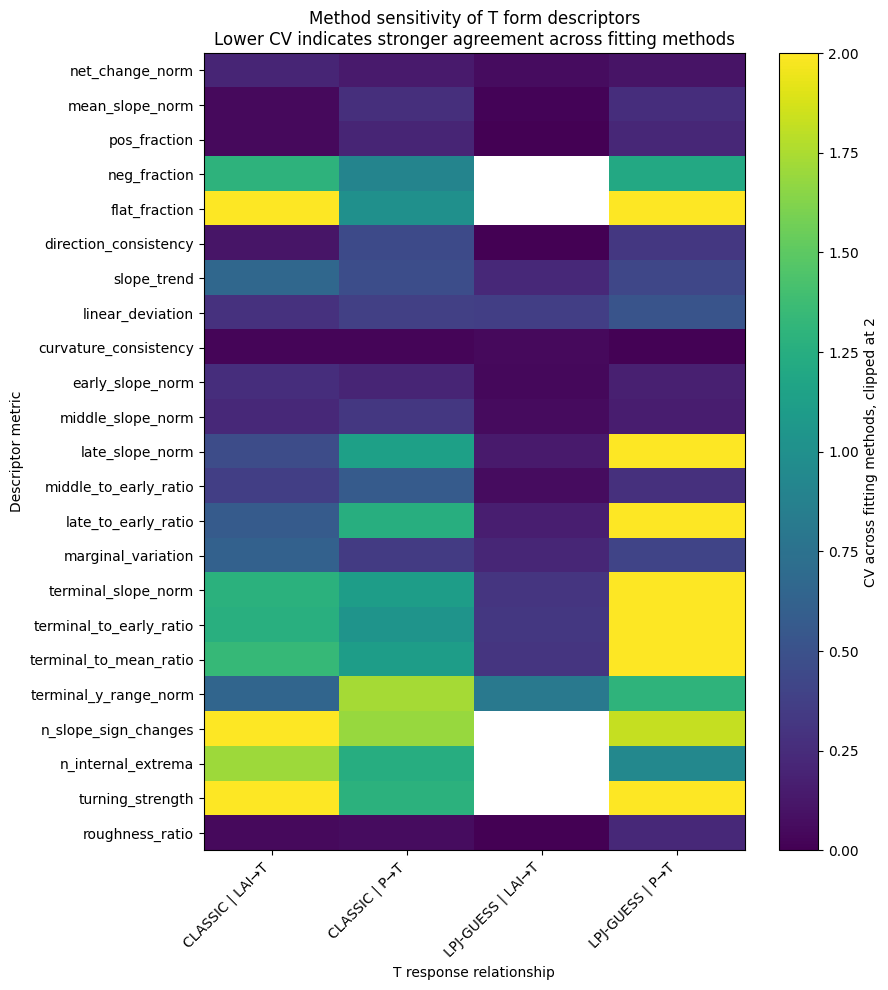

In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path


# ============================================================
# 1. Read method consistency table for T
# ============================================================

method_consistency_t = pd.read_csv("./slope_output/method_consistency_by_metric_t.csv")


# ============================================================
# 2. Create CV pivot table
# ============================================================

cv_pivot = method_consistency_t.pivot_table(
    index="descriptor_metric",
    columns="relationship",
    values="cv",
    aggfunc="mean"
)

# Optional: order metrics by descriptor group
metric_order = [
    # Overall direction
    "net_change_norm",
    "mean_slope_norm",
    "pos_fraction",
    "neg_fraction",
    "flat_fraction",
    "direction_consistency",

    # Dominant curvature
    "slope_trend",
    "linear_deviation",
    "curvature_consistency",

    # Marginal-response pattern
    "early_slope_norm",
    "middle_slope_norm",
    "late_slope_norm",
    "middle_to_early_ratio",
    "late_to_early_ratio",
    "marginal_variation",

    # Terminal behavior
    "terminal_slope_norm",
    "terminal_to_early_ratio",
    "terminal_to_mean_ratio",
    "terminal_y_range_norm",

    # Turning complexity
    "n_slope_sign_changes",
    "n_internal_extrema",
    "turning_strength",
    "roughness_ratio",
]

metric_order = [m for m in metric_order if m in cv_pivot.index]
cv_pivot = cv_pivot.loc[metric_order]

# Clip very large CV values for visualization
cv_plot = cv_pivot.clip(upper=2)


# ============================================================
# 3. Plot heatmap
# ============================================================

fig, ax = plt.subplots(figsize=(9, 10))

im = ax.imshow(cv_plot.values, aspect="auto")

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("CV across fitting methods, clipped at 2")

ax.set_xticks(np.arange(len(cv_plot.columns)))
ax.set_xticklabels(cv_plot.columns, rotation=45, ha="right")

ax.set_yticks(np.arange(len(cv_plot.index)))
ax.set_yticklabels(cv_plot.index)

ax.set_title(
    "Method sensitivity of T form descriptors\n"
    "Lower CV indicates stronger agreement across fitting methods"
)

ax.set_xlabel("T response relationship")
ax.set_ylabel("Descriptor metric")

plt.tight_layout()
# plt.savefig("./method_sensitivity_heatmap_t.png", dpi=300, bbox_inches="tight")
plt.show()

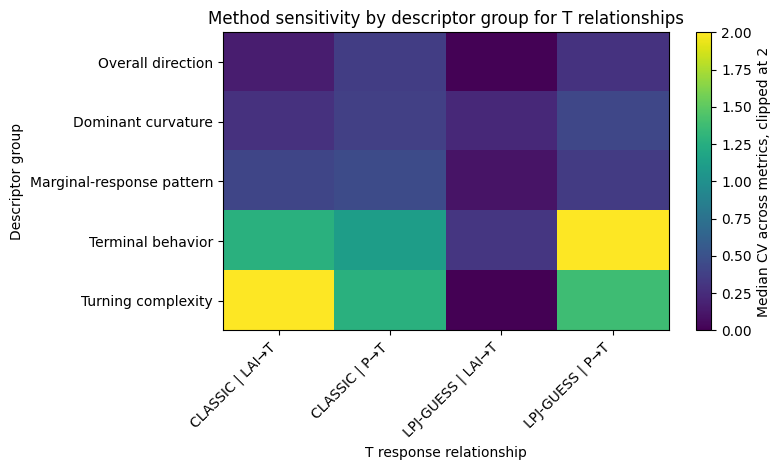

In [50]:
# ============================================================
# 1. Add descriptor group information
# ============================================================

descriptor_groups = {
    "Overall direction": [
        "net_change_norm",
        "mean_slope_norm",
        "pos_fraction",
        "neg_fraction",
        "flat_fraction",
        "direction_consistency",
    ],

    "Dominant curvature": [
        "slope_trend",
        "linear_deviation",
        "curvature_consistency",
    ],

    "Marginal-response pattern": [
        "early_slope_norm",
        "middle_slope_norm",
        "late_slope_norm",
        "middle_to_early_ratio",
        "late_to_early_ratio",
        "marginal_variation",
    ],

    "Terminal behavior": [
        "terminal_slope_norm",
        "terminal_to_early_ratio",
        "terminal_to_mean_ratio",
        "terminal_y_range_norm",
    ],

    "Turning complexity": [
        "n_slope_sign_changes",
        "n_internal_extrema",
        "turning_strength",
        "roughness_ratio",
    ],
}

metric_to_group = {
    metric: group
    for group, metrics in descriptor_groups.items()
    for metric in metrics
}

method_consistency_t["descriptor_group"] = method_consistency_t["descriptor_metric"].map(metric_to_group)

group_cv = (
    method_consistency_t
    .dropna(subset=["descriptor_group"])
    .groupby(["relationship", "descriptor_group"], as_index=False)["cv"]
    .median()
)

group_pivot = group_cv.pivot_table(
    index="descriptor_group",
    columns="relationship",
    values="cv",
    aggfunc="median"
)

group_order = [
    "Overall direction",
    "Dominant curvature",
    "Marginal-response pattern",
    "Terminal behavior",
    "Turning complexity",
]

group_pivot = group_pivot.loc[[g for g in group_order if g in group_pivot.index]]
group_plot = group_pivot.clip(upper=2)


# ============================================================
# 2. Plot group-level heatmap
# ============================================================

fig, ax = plt.subplots(figsize=(8, 4.8))

im = ax.imshow(group_plot.values, aspect="auto")

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Median CV across metrics, clipped at 2")

ax.set_xticks(np.arange(len(group_plot.columns)))
ax.set_xticklabels(group_plot.columns, rotation=45, ha="right")

ax.set_yticks(np.arange(len(group_plot.index)))
ax.set_yticklabels(group_plot.index)

ax.set_title(
    "Method sensitivity by descriptor group for T relationships"
)

ax.set_xlabel("T response relationship")
ax.set_ylabel("Descriptor group")

plt.tight_layout()
# plt.savefig("./method_sensitivity_by_descriptor_group_t.png", dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
# ============================================================
# 1. Add descriptor group information
# ============================================================

descriptor_groups = {
    "Overall direction": [
        "net_change_norm",
        "mean_slope_norm",
        "pos_fraction",
        "neg_fraction",
        "flat_fraction",
        "direction_consistency",
    ],

    "Dominant curvature": [
        "slope_trend",
        "linear_deviation",
        "curvature_consistency",
    ],

    "Marginal-response pattern": [
        "early_slope_norm",
        "middle_slope_norm",
        "late_slope_norm",
        "middle_to_early_ratio",
        "late_to_early_ratio",
        "marginal_variation",
    ],

    "Terminal behavior": [
        "terminal_slope_norm",
        "terminal_to_early_ratio",
        "terminal_to_mean_ratio",
        "terminal_y_range_norm",
    ],

    "Turning complexity": [
        "n_slope_sign_changes",
        "n_internal_extrema",
        "turning_strength",
        "roughness_ratio",
    ],
}

metric_to_group = {
    metric: group
    for group, metrics in descriptor_groups.items()
    for metric in metrics
}

method_consistency_t["descriptor_group"] = method_consistency_t["descriptor_metric"].map(metric_to_group)

group_cv = (
    method_consistency_t
    .dropna(subset=["descriptor_group"])
    .groupby(["relationship", "descriptor_group"], as_index=False)["cv"]
    .median()
)

group_pivot = group_cv.pivot_table(
    index="descriptor_group",
    columns="relationship",
    values="cv",
    aggfunc="median"
)

group_order = [
    "Overall direction",
    "Dominant curvature",
    "Marginal-response pattern",
    "Terminal behavior",
    "Turning complexity",
]

group_pivot = group_pivot.loc[[g for g in group_order if g in group_pivot.index]]
group_plot = group_pivot.clip(upper=2)


# ============================================================
# 2. Plot group-level heatmap
# ============================================================

fig, ax = plt.subplots(figsize=(8, 4.8))

im = ax.imshow(group_plot.values, aspect="auto")

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Median CV across metrics, clipped at 2")

ax.set_xticks(np.arange(len(group_plot.columns)))
ax.set_xticklabels(group_plot.columns, rotation=45, ha="right")

ax.set_yticks(np.arange(len(group_plot.index)))
ax.set_yticklabels(group_plot.index)

ax.set_title(
    "Method sensitivity by descriptor group for T relationships"
)

ax.set_xlabel("T response relationship")
ax.set_ylabel("Descriptor group")

plt.tight_layout()
# plt.savefig("./method_sensitivity_by_descriptor_group_t.png", dpi=300, bbox_inches="tight")
plt.show()

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path


# ============================================================
# 1. Read T descriptor summary
# ============================================================

input_path = Path("./slope_output/relationship_descriptor_summary_t.csv")
df_t = pd.read_csv(input_path)

df_t["target_output"] = "T"


# ============================================================
# 2. Define descriptor groups and metrics
# ============================================================

descriptor_groups = {
    "Overall direction": [
        "net_change_norm",
        "mean_slope_norm",
        "pos_fraction",
        "neg_fraction",
        "flat_fraction",
        "direction_consistency",
    ],

    "Dominant curvature": [
        "slope_trend",
        "linear_deviation",
        "curvature_consistency",
    ],

    "Marginal-response pattern": [
        "early_slope_norm",
        "middle_slope_norm",
        "late_slope_norm",
        "middle_to_early_ratio",
        "late_to_early_ratio",
        "marginal_variation",
    ],

    "Terminal behavior": [
        "terminal_slope_norm",
        "terminal_to_early_ratio",
        "terminal_to_mean_ratio",
        "terminal_y_range_norm",
    ],

    "Turning complexity": [
        "n_slope_sign_changes",
        "n_internal_extrema",
        "turning_strength",
        "roughness_ratio",
    ],
}

descriptor_metrics = [
    metric
    for metrics in descriptor_groups.values()
    for metric in metrics
    if metric in df_t.columns
]

metric_to_group = {
    metric: group
    for group, metrics in descriptor_groups.items()
    for metric in metrics
}


for col in descriptor_metrics:
    df_t[col] = pd.to_numeric(df_t[col], errors="coerce")


# ============================================================
# 3. Compute global range for each descriptor metric
# ============================================================

global_ranges = {}

for metric in descriptor_metrics:
    values = df_t[metric].replace([np.inf, -np.inf], np.nan).dropna()

    if len(values) == 0:
        global_ranges[metric] = np.nan
    else:
        global_ranges[metric] = values.max() - values.min()


# ============================================================
# 4. Robustness rule
# ============================================================

def classify_robustness(score):
    if pd.isna(score):
        return "undefined"
    elif score < 0.3:
        return "keep"
    elif score < 0.5:
        return "method-sensitive"
    else:
        return "remove-or-redefine"


def compute_robustness_score(values, global_range, mean_zero_tol=1e-6):
    """
    If mean is close to zero, use normalized range:
        robustness_score = local_range / global_range

    Otherwise use CV:
        robustness_score = SD / |mean|
    """

    values = pd.Series(values).replace([np.inf, -np.inf], np.nan).dropna()

    if len(values) == 0:
        return np.nan, "no_valid_values"

    mean_val = values.mean()
    sd_val = values.std(ddof=1) if len(values) > 1 else 0
    local_range = values.max() - values.min()
    median_val = values.median()
    iqr_val = values.quantile(0.75) - values.quantile(0.25)

    if np.isclose(abs(mean_val), 0, atol=mean_zero_tol):
        if pd.isna(global_range) or np.isclose(global_range, 0):
            score = np.nan
        else:
            score = local_range / global_range
        score_type = "range_over_global_range"
    else:
        score = sd_val / abs(mean_val)
        score_type = "cv"

    return score, score_type


# ============================================================
# 5. Calculate robustness table
# ============================================================

group_cols = ["model", "x", "y"]

robustness_rows = []

for relationship_key, g in df_t.groupby(group_cols):
    model, x, y = relationship_key
    relationship = f"{model} | {x}→{y}"

    for metric in descriptor_metrics:
        values = g[metric].replace([np.inf, -np.inf], np.nan).dropna()
        global_range = global_ranges.get(metric, np.nan)

        score, score_type = compute_robustness_score(
            values,
            global_range,
            mean_zero_tol=1e-6
        )

        mean_val = values.mean() if len(values) > 0 else np.nan
        median_val = values.median() if len(values) > 0 else np.nan
        sd_val = values.std(ddof=1) if len(values) > 1 else 0
        local_range = values.max() - values.min() if len(values) > 0 else np.nan
        iqr_val = values.quantile(0.75) - values.quantile(0.25) if len(values) > 0 else np.nan

        robustness_rows.append({
            "target_output": "T",
            "model": model,
            "x": x,
            "y": y,
            "relationship": relationship,
            "descriptor_group": metric_to_group.get(metric),
            "descriptor_metric": metric,
            "n_methods": len(values),
            "mean": mean_val,
            "median": median_val,
            "sd": sd_val,
            "iqr": iqr_val,
            "local_range": local_range,
            "global_range": global_range,
            "robustness_score": score,
            "score_type": score_type,
            "decision": classify_robustness(score),
        })

descriptor_robustness_t = pd.DataFrame(robustness_rows)

descriptor_robustness_t.to_csv(
    "./slope_output/descriptor_robustness_t.csv",
    index=False
)

print("Saved: descriptor_robustness_t.csv")

display(
    descriptor_robustness_t.sort_values(
        ["relationship", "robustness_score"],
        ascending=[True, False]
    )
)

Saved: descriptor_robustness_t.csv


,target_output,model,x,y,relationship,descriptor_group,descriptor_metric,n_methods,mean,median,sd,iqr,local_range,global_range,robustness_score,score_type,decision
4,T,CLASSIC,LAI,T,CLASSIC | LAI→T,Overall direction,flat_fraction,7,0.000614,0.0000,0.001625,0.00000,0.004300,0.50500,2.645751,cv,remove-or-redefine
19,T,CLASSIC,LAI,T,CLASSIC | LAI→T,Turning complexity,n_slope_sign_changes,7,20.571429,1.0000,52.668324,1.50000,140.000000,140.00000,2.560266,cv,remove-or-redefine
21,T,CLASSIC,LAI,T,CLASSIC | LAI→T,Turning complexity,turning_strength,7,0.010571,0.0000,0.026081,0.00220,0.069600,0.26580,2.467098,cv,remove-or-redefine
20,T,CLASSIC,LAI,T,CLASSIC | LAI→T,Turning complexity,n_internal_extrema,7,0.285714,0.0000,0.487950,0.50000,1.000000,1.00000,1.707825,cv,remove-or-redefine
17,T,CLASSIC,LAI,T,CLASSIC | LAI→T,Terminal behavior,terminal_to_mean_ratio,7,0.733830,0.8452,0.981323,1.02709,2.774483,4.37565,1.337262,cv,remove-or-redefine
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,T,LPJ-GUESS,P,T,LPJ-GUESS | P→T,Overall direction,pos_fraction,7,0.829971,0.8889,0.183834,0.22465,0.505000,0.50500,0.221494,cv,keep
78,T,LPJ-GUESS,P,T,LPJ-GUESS | P→T,Marginal-response pattern,early_slope_norm,7,1.907086,2.0625,0.330045,0.30890,0.870300,1.75400,0.173062,cv,keep
79,T,LPJ-GUESS,P,T,LPJ-GUESS | P→T,Marginal-response pattern,middle_slope_norm,7,1.031014,0.9530,0.168539,0.18125,0.433000,0.84520,0.163469,cv,keep
69,T,LPJ-GUESS,P,T,LPJ-GUESS | P→T,Overall direction,net_change_norm,7,0.715200,0.7307,0.074460,0.10460,0.200900,0.43450,0.104111,cv,keep


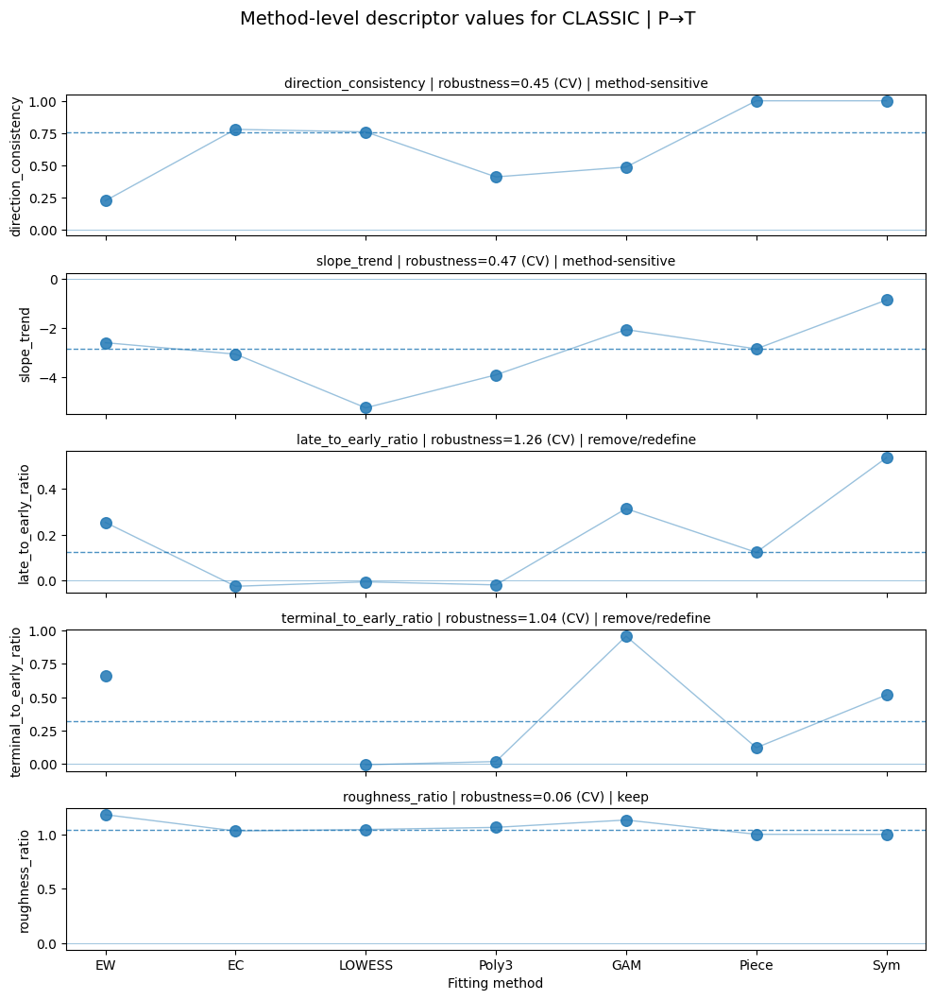

Saved: ./descriptor_dotplot_t_CLASSIC_P_to_T.png


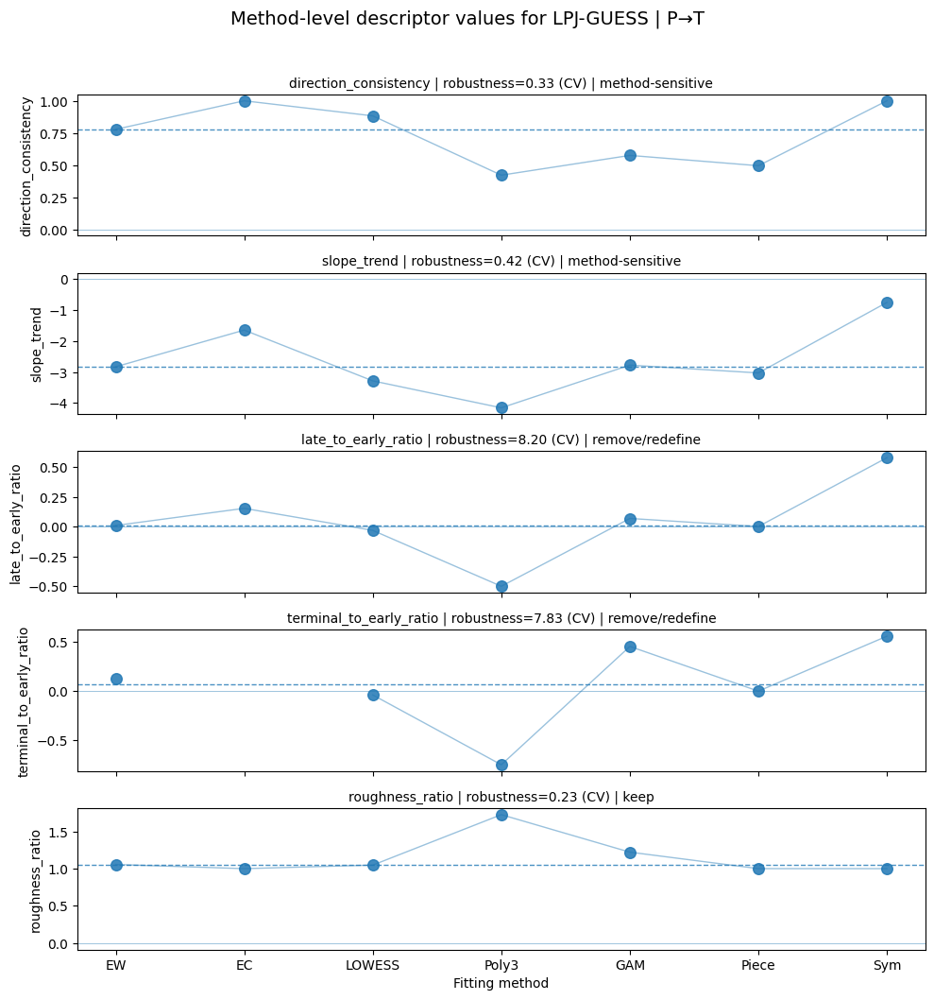

Saved: ./descriptor_dotplot_t_LPJ-GUESS_P_to_T.png


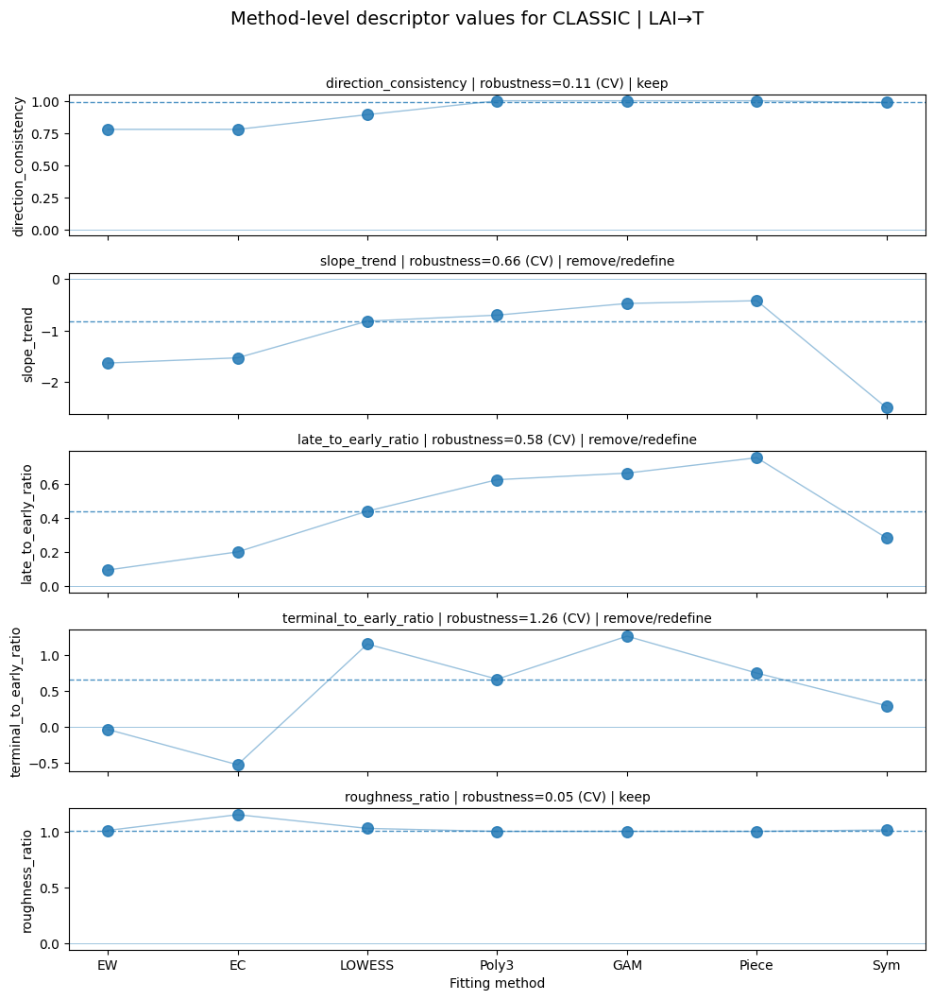

Saved: ./descriptor_dotplot_t_CLASSIC_LAI_to_T.png


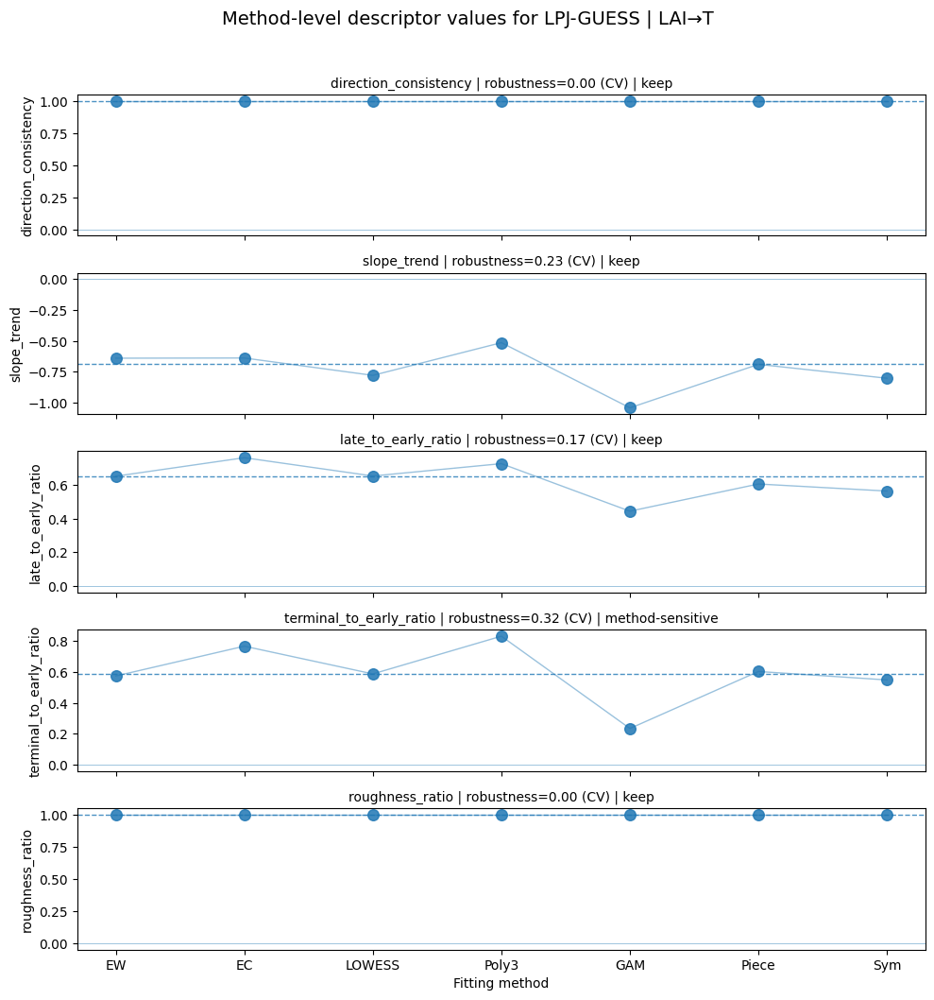

Saved: ./descriptor_dotplot_t_LPJ-GUESS_LAI_to_T.png


In [52]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# from pathlib import Path


# # ============================================================
# # 1. Read T descriptor summary
# # ============================================================

# df_t = pd.read_csv("./slope_output/relationship_descriptor_summary_t.csv")
# df_t["target_output"] = "T"


# # ============================================================
# # 2. Define key metrics to inspect
# # ============================================================

# metrics_to_plot = [
#     "direction_consistency",
#     "slope_trend",
#     "late_to_early_ratio",
#     "terminal_to_early_ratio",
#     "roughness_ratio",
# ]

# for col in metrics_to_plot:
#     df_t[col] = pd.to_numeric(df_t[col], errors="coerce")


# # ============================================================
# # 3. Compute global range for zero-mean fallback
# # ============================================================

# global_ranges = {}

# for metric in metrics_to_plot:
#     values = df_t[metric].replace([np.inf, -np.inf], np.nan).dropna()
#     global_ranges[metric] = values.max() - values.min()


# # ============================================================
# # 4. Robustness score function
# # ============================================================

# def compute_robustness_score(values, global_range, mean_zero_tol=1e-6):
#     values = pd.Series(values).replace([np.inf, -np.inf], np.nan).dropna()

#     if len(values) == 0:
#         return np.nan, "no valid values"

#     mean_val = values.mean()
#     sd_val = values.std(ddof=1) if len(values) > 1 else 0
#     local_range = values.max() - values.min()

#     if np.isclose(abs(mean_val), 0, atol=mean_zero_tol):
#         if pd.isna(global_range) or np.isclose(global_range, 0):
#             return np.nan, "undefined"
#         return local_range / global_range, "range/global range"
#     else:
#         return sd_val / abs(mean_val), "CV"


# def robustness_decision(score):
#     if pd.isna(score):
#         return "undefined"
#     elif score < 0.3:
#         return "keep"
#     elif score < 0.5:
#         return "method-sensitive"
#     else:
#         return "remove/redefine"


# # ============================================================
# # 5. Short method names
# # ============================================================

# method_order = [
#     "Equal-width bins",
#     "Equal-count bins",
#     "LOWESS",
#     "Polynomial degree 3",
#     "GAM",
#     "Piecewise linear",
#     "Symbolic regression",
# ]

# method_short_map = {
#     "Equal-width bins": "EW",
#     "Equal-count bins": "EC",
#     "LOWESS": "LOWESS",
#     "Polynomial degree 3": "Poly3",
#     "GAM": "GAM",
#     "Piecewise linear": "Piece",
#     "Symbolic regression": "Sym",
# }


# # ============================================================
# # 6. Plot one relationship
# # ============================================================

# def plot_descriptor_dotplot_for_relationship(df, model, x, y="T"):
#     sub = df[
#         (df["model"] == model)
#         & (df["x"] == x)
#         & (df["y"] == y)
#     ].copy()

#     if sub.empty:
#         print(f"No data found for {model} | {x}→{y}")
#         return

#     sub["method"] = pd.Categorical(
#         sub["method"],
#         categories=method_order,
#         ordered=True
#     )
#     sub = sub.sort_values("method")
#     sub["method_short"] = sub["method"].map(method_short_map)

#     fig, axes = plt.subplots(
#         len(metrics_to_plot),
#         1,
#         figsize=(10, 2.15 * len(metrics_to_plot)),
#         sharex=True
#     )

#     if len(metrics_to_plot) == 1:
#         axes = [axes]

#     for ax, metric in zip(axes, metrics_to_plot):
#         values = pd.to_numeric(sub[metric], errors="coerce")

#         score, score_type = compute_robustness_score(
#             values,
#             global_ranges[metric]
#         )
#         decision = robustness_decision(score)

#         ax.scatter(
#             sub["method_short"],
#             values,
#             s=70,
#             alpha=0.85
#         )

#         ax.plot(
#             sub["method_short"],
#             values,
#             linewidth=1.0,
#             alpha=0.45
#         )

#         median_val = values.median()
#         ax.axhline(
#             median_val,
#             linestyle="--",
#             linewidth=1.0,
#             alpha=0.8
#         )

#         ax.axhline(0, linewidth=0.6, alpha=0.5)

#         if pd.isna(score):
#             score_text = "NA"
#         else:
#             score_text = f"{score:.2f}"

#         ax.set_ylabel(metric)
#         ax.set_title(
#             f"{metric} | robustness={score_text} ({score_type}) | {decision}",
#             fontsize=10
#         )

#     axes[-1].set_xlabel("Fitting method")

#     fig.suptitle(
#         f"Method-level descriptor values for {model} | {x}→{y}",
#         fontsize=14
#     )

#     plt.tight_layout(rect=[0, 0, 1, 0.96])

#     output_path = f"./descriptor_dotplot_t_{model}_{x}_to_{y}.png"
#     output_path = output_path.replace(" ", "_").replace("|", "")

#     # plt.savefig(output_path, dpi=300, bbox_inches="tight")
#     plt.show()

#     print(f"Saved: {output_path}")


# # ============================================================
# # 7. Draw four plots
# # ============================================================

# plot_descriptor_dotplot_for_relationship(df_t, "CLASSIC", "P", "T")
# plot_descriptor_dotplot_for_relationship(df_t, "LPJ-GUESS", "P", "T")
# plot_descriptor_dotplot_for_relationship(df_t, "CLASSIC", "LAI", "T")
# plot_descriptor_dotplot_for_relationship(df_t, "LPJ-GUESS", "LAI", "T")

## PCA

In [43]:
import pandas as pd
import numpy as np
from pathlib import Path

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt


# ============================================================
# 1. Read T relationship descriptor summary
# ============================================================

input_path = Path("./slope_output/relationship_descriptor_summary_t.csv")

pca_output_csv = Path("./slope_output/form_atlas_pca_t.csv")

fig_input_path = Path("./slope_output/form_atlas_t_by_input.png")
fig_model_path = Path("./slope_output/form_atlas_t_by_model.png")
fig_method_path = Path("./slope_output/form_atlas_t_by_method.png")
fig_label_path = Path("./slope_output/form_atlas_t_labeled.png")

df_t = pd.read_csv(input_path)

# Make sure this is T
if "target_output" not in df_t.columns:
    df_t["target_output"] = "T"

df_t["target_output"] = "T"


# ============================================================
# 2. Define Form descriptor metrics for PCA
# ============================================================

form_features_t = [
    # Overall direction
    "net_change_norm",
    "mean_slope_norm",
    "pos_fraction",
    "neg_fraction",
    "flat_fraction",
    "direction_consistency",

    # Dominant curvature
    "slope_trend",
    "linear_deviation",
    "curvature_consistency",

    # Marginal-response pattern
    "early_slope_norm",
    "middle_slope_norm",
    "late_slope_norm",
    "middle_to_early_ratio",
    "late_to_early_ratio",
    "marginal_variation",

    # Terminal behavior
    "terminal_slope_norm",
    "terminal_to_early_ratio",
    "terminal_to_mean_ratio",
    "terminal_y_range_norm",

    # Turning complexity
    "n_slope_sign_changes",
    "n_internal_extrema",
    "turning_strength",
    "roughness_ratio",
]

# Keep only columns that exist
form_features_t = [c for c in form_features_t if c in df_t.columns]


# ============================================================
# 3. Clean feature matrix
# ============================================================

X_t = df_t[form_features_t].copy()

for col in form_features_t:
    X_t[col] = pd.to_numeric(X_t[col], errors="coerce")

X_t = X_t.replace([np.inf, -np.inf], np.nan)

# Drop columns that are completely empty
all_nan_cols = X_t.columns[X_t.isna().all()].tolist()
if len(all_nan_cols) > 0:
    print("Dropped all-NaN columns:", all_nan_cols)
    X_t = X_t.drop(columns=all_nan_cols)

# Fill missing values with column median
X_t = X_t.fillna(X_t.median(numeric_only=True))

# Drop zero-variance columns
zero_var_cols = X_t.columns[X_t.std(axis=0) == 0].tolist()
if len(zero_var_cols) > 0:
    print("Dropped zero-variance columns:", zero_var_cols)
    X_t = X_t.drop(columns=zero_var_cols)

used_features_t = X_t.columns.tolist()

print("Features used for T Form PCA:")
print(used_features_t)


# ============================================================
# 4. Standardize and run PCA
# ============================================================

scaler_t = StandardScaler()
X_scaled_t = scaler_t.fit_transform(X_t)

pca_t = PCA(n_components=2)
scores_t = pca_t.fit_transform(X_scaled_t)

df_pca_t = df_t.copy()
df_pca_t["PC1"] = scores_t[:, 0]
df_pca_t["PC2"] = scores_t[:, 1]

explained_t = pca_t.explained_variance_ratio_

print("\nT Form atlas PCA explained variance:")
print(f"PC1: {explained_t[0] * 100:.2f}%")
print(f"PC2: {explained_t[1] * 100:.2f}%")
print(f"PC1 + PC2: {explained_t[:2].sum() * 100:.2f}%")

df_pca_t.to_csv(pca_output_csv, index=False)
print(f"\nSaved T PCA table to: {pca_output_csv}")

Features used for T Form PCA:
['net_change_norm', 'mean_slope_norm', 'pos_fraction', 'neg_fraction', 'flat_fraction', 'direction_consistency', 'slope_trend', 'linear_deviation', 'curvature_consistency', 'early_slope_norm', 'middle_slope_norm', 'late_slope_norm', 'middle_to_early_ratio', 'late_to_early_ratio', 'marginal_variation', 'terminal_slope_norm', 'terminal_to_early_ratio', 'terminal_to_mean_ratio', 'terminal_y_range_norm', 'n_slope_sign_changes', 'n_internal_extrema', 'turning_strength', 'roughness_ratio']

T Form atlas PCA explained variance:
PC1: 43.39%
PC2: 18.86%
PC1 + PC2: 62.25%

Saved T PCA table to: slope_output/form_atlas_pca_t.csv


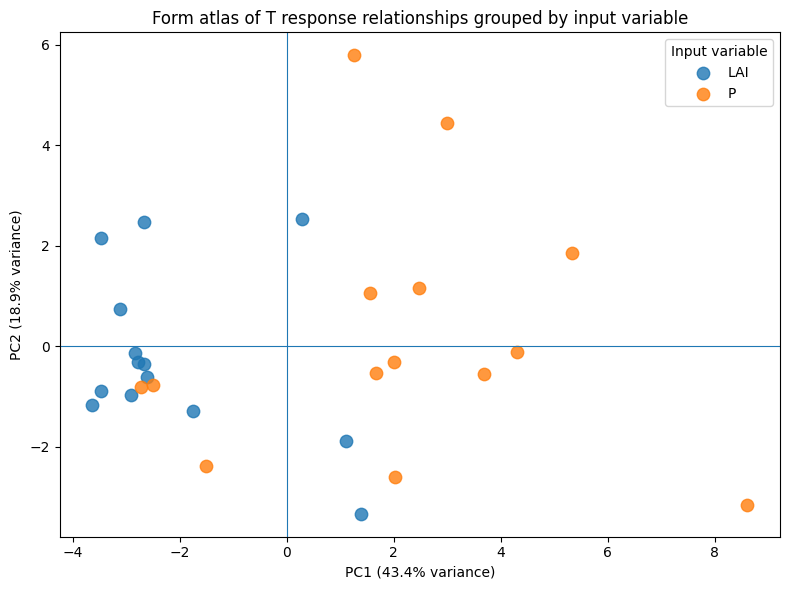

Saved figure to: slope_output/form_atlas_t_by_input.png


In [44]:
# ============================================================
# 5. Plot T Form atlas by input variable
# ============================================================

plt.figure(figsize=(8, 6))

for x_name, sub in df_pca_t.groupby("x"):
    plt.scatter(
        sub["PC1"],
        sub["PC2"],
        label=x_name,
        s=80,
        alpha=0.8
    )

plt.axhline(0, linewidth=0.8)
plt.axvline(0, linewidth=0.8)

plt.xlabel(f"PC1 ({explained_t[0] * 100:.1f}% variance)")
plt.ylabel(f"PC2 ({explained_t[1] * 100:.1f}% variance)")
plt.title("Form atlas of T response relationships grouped by input variable")
plt.legend(title="Input variable")

plt.tight_layout()
plt.savefig(fig_input_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved figure to: {fig_input_path}")

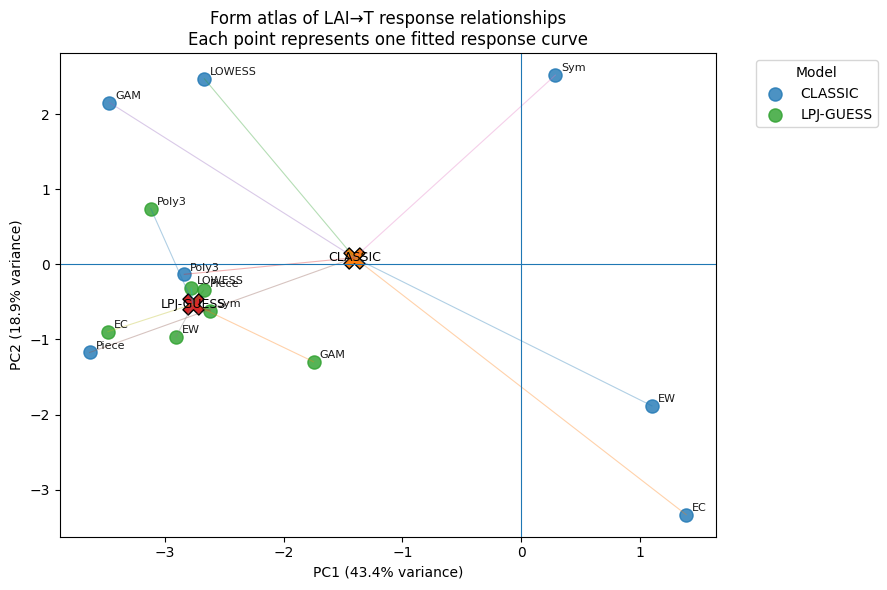

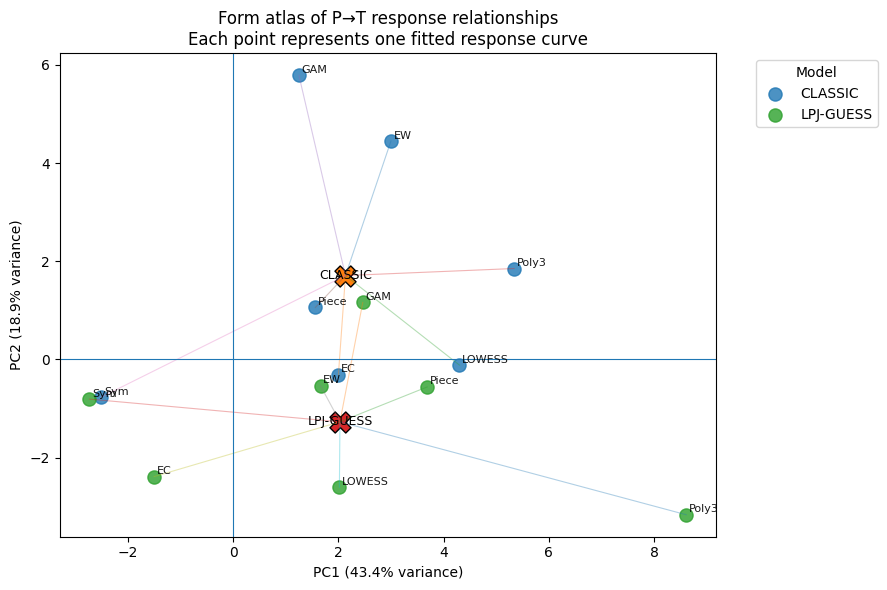

In [47]:
import matplotlib.pyplot as plt


# ============================================================
# Helper: short method names
# ============================================================

def shorten_method_name(method):
    return (
        str(method)
        .replace("Polynomial degree 3", "Poly3")
        .replace("Equal-width bins", "EW")
        .replace("Equal-count bins", "EC")
        .replace("Piecewise linear", "Piece")
        .replace("Symbolic regression", "Sym")
    )


# ============================================================
# Helper: plot one input variable for T
# ============================================================

def plot_t_form_atlas_one_input(df_pca_t, input_name, explained_t):
    """
    Plot Form atlas for one input variable, e.g. P→T or LAI→T.

    Each point represents one fitted response curve:
        model + input + output + fitting method

    The X marker represents the centroid of all fitting methods
    for one model-input-output relationship.
    """

    sub_input = df_pca_t[df_pca_t["x"] == input_name].copy()

    fig, ax = plt.subplots(figsize=(9, 6))

    for model_name, sub_model in sub_input.groupby("model"):
        # Centroid of all methods for this model-input relationship
        cx = sub_model["PC1"].mean()
        cy = sub_model["PC2"].mean()

        # Method-level points
        ax.scatter(
            sub_model["PC1"],
            sub_model["PC2"],
            s=90,
            alpha=0.8,
            label=model_name
        )

        # Lines from centroid to each method point
        for _, row in sub_model.iterrows():
            ax.plot(
                [cx, row["PC1"]],
                [cy, row["PC2"]],
                linewidth=0.8,
                alpha=0.35
            )

            ax.text(
                row["PC1"] + 0.05,
                row["PC2"] + 0.05,
                shorten_method_name(row["method"]),
                fontsize=8,
                alpha=0.9
            )

        # Centroid
        ax.scatter(
            cx,
            cy,
            s=230,
            marker="X",
            edgecolor="black",
            linewidth=1.0
        )

        ax.text(
            cx,
            cy,
            model_name,
            fontsize=9,
            ha="center",
            va="center"
        )

    ax.axhline(0, linewidth=0.8)
    ax.axvline(0, linewidth=0.8)

    ax.set_xlabel(f"PC1 ({explained_t[0] * 100:.1f}% variance)")
    ax.set_ylabel(f"PC2 ({explained_t[1] * 100:.1f}% variance)")

    ax.set_title(
        f"Form atlas of {input_name}→T response relationships\n"
        "Each point represents one fitted response curve"
    )

    ax.legend(title="Model", bbox_to_anchor=(1.05, 1), loc="upper left")

    plt.tight_layout()

    # output_path = f"./form_atlas_t_{input_name.lower()}_only.png"
    # plt.savefig(output_path, dpi=300, bbox_inches="tight")
    plt.show()

    # print(f"Saved figure to: {output_path}")


# ============================================================
# Draw separate figures for LAI→T and P→T
# ============================================================

plot_t_form_atlas_one_input(df_pca_t, "LAI", explained_t)
plot_t_form_atlas_one_input(df_pca_t, "P", explained_t)